# Nishika トレーニングコンペ  
## ~ 日本絵画に描かれた人物の顔分類に機械学習で挑戦！ ~  
https://www.nishika.com/competitions/9/summary  



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. install, import


In [2]:
#Pytorchのimage modelsライブラリtimmをインストール
!pip install timm
#optunaをインストール
!pip install optuna
#gradcamをインストール
!pip install grad_cam

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 509 kB 8.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 348 kB 7.8 MB/s 
     |████████████████████████████████| 81 kB 9.0 MB/s 
     |████████████████████████████████| 209 kB 73.6 MB/s 
     |████████████████████████████████| 78 kB 7.1 MB/s 
     |████████████████████████████████| 147 kB 78.9 MB/s 
     |████████████████████████████████| 112 kB 87.1 MB/s 
     |████████████████████████████████| 49 kB 4.9 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=63c114ddf13f4146fab9bc8c15cb61d206c38a23562ac761b3a060a92b26d07e
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip
Looking in indexes: https://pypi.org/simple, https://u

In [3]:
import torch
import torchvision
import random
import matplotlib.pyplot as plt
import numpy as np
import timm
from pprint import pprint #timmのリストを縦に表示するためにimport 
import pandas as pd
from PIL import Image
import pathlib
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, datasets
from pathlib import Path
import os #パスから名前をとるとき（pathを使うとき）に必要
import shutil #新たに作成したディレクトリに画像をコピーするときに使用
import seaborn as sns
from sklearn.metrics import accuracy_score #最後の正解率出す時に使用する
from torch.optim.lr_scheduler import StepLR #scheduler
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split #train, val用のデータを分割する際に使用
#↓optuna用に追加
import optuna
from optuna.trial import TrialState
#↓gradcam用に追加
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
import cv2

In [19]:
device = 'cuda'
seed = 42

np.random.seed(seed)
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

## 2. csvファイルをdataframeで読み込む

In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train.csv')
df_train.head()

,image,gender_status
0,n_00001.jpg,4
1,n_00002.jpg,0
2,n_00003.jpg,0
3,n_00005.jpg,0
4,n_00006.jpg,0


In [ ]:
len(df_train)

4238

## 3. 新たなディレクトリ（genderstatusのカテゴリごとに作ったディレクトリ）に画像をコピーするコード。  
## ※初回以外は実行しない


In [ ]:
# input_dir_train = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train'
# image_list_train = list(pathlib.Path(input_dir_train).glob('**/*.jpg')) #input_dir_trainで指定したフォルダ内のjpg拡張子のみリスト化する

# input_dir_test = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/test'
# image_list_test = list(pathlib.Path(input_dir_test).glob('**/*.jpg')) #input_dir_trainで指定したフォルダ内のjpg拡張子のみリスト化する

In [ ]:
# #image_pathがposixpathというpathlibで読み込むとなる型になり、split関数が使えない
# #image_pathをstr型に変更。listのままstr型に変更しても反映されないため、1ずつ取り出してstr型にする。
# path = []
# for fx in image_list_train: #リストから１つずつposixpathを取り出し、str型に変更する
#     fx = str(fx)
#     path.append(fx)
# path.sort()
# len(path)

In [ ]:
# #df_train['image_path']にpathを追加する
# df_train['image_path'] = path
# df_train.head()

In [ ]:
# # #学習しやすいように、train, testディレクトリに入っている画像ファイルをラベルごと（gender_statusの8つの階級）に分けて新たなディレクトリにコピーする

# # #新たに作成したディレクトリ（gender_statusの8つの階級）にファイルをコピーしていく
# for i, path in enumerate(df_train['image_path']): #df_train['image_path']からファイルパスを取得
#   gen_st = str(df_train['gender_status'][i]) #取得したファイルパスの画像がgender_statusのどのカテゴリかを取得する。下でstr型と結合するため、str型に変換する。
#   save_dir = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/' + gen_st + '/' + df_train['image'][i] #カテゴリ別に分けた新たなディレクトリに同じ名前のパスを指定
#   shutil.copyfile(path, save_dir) #shutil.copyfileとやらでコピーができるらしい

## 4. データを見てみる

gender_statusのカテゴリの意味は以下の通り  
0:男-貴族, 1:男-武士, 2:男-化身, 3:男-庶民
4:女-貴族, 5:女-武士, 6:女-化身, 7:女-庶民

In [ ]:
# input_dir_train = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/train'
# image_list_train = list(pathlib.Path(input_dir_train).glob('**/*.jpg')) #input_dir_trainで指定したフォルダ内のjpg拡張子のみリスト化する
# image_list_train.sort() #以下でこのリストとdf_trainを結合するため、ソートしておく

# input_dir_test = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/test'
# image_list_test = list(pathlib.Path(input_dir_test).glob('**/*.jpg')) #input_dir_trainで指定したフォルダ内のjpg拡張子のみリスト化する

In [ ]:
# #df_train['image_path']にpathを追加する
# df_train['image_path'] = image_list_train
# df_train.head()

In [ ]:
# #上記のdf_trainをcsv化する
# df_train.to_csv('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train_path.csv')

In [ ]:
#train.csvにimage_pathを追加した自作dataframeのtrain_path.csvを読み込み
df_train = pd.read_csv('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train_path.csv')
df_train.head()

,Unnamed: 0,image,gender_status,image_path
0,0,n_00001.jpg,4,/content/drive/MyDrive/compe/Nishika/JapanPic_...
1,1,n_00002.jpg,0,/content/drive/MyDrive/compe/Nishika/JapanPic_...
2,2,n_00003.jpg,0,/content/drive/MyDrive/compe/Nishika/JapanPic_...
3,3,n_00005.jpg,0,/content/drive/MyDrive/compe/Nishika/JapanPic_...
4,4,n_00006.jpg,0,/content/drive/MyDrive/compe/Nishika/JapanPic_...


In [ ]:
#ユニーク数
df_train['gender_status'].value_counts()


1    1294
0    1210
4     834
2     375
3     371
7     100
6      53
5       1
Name: gender_status, dtype: int64

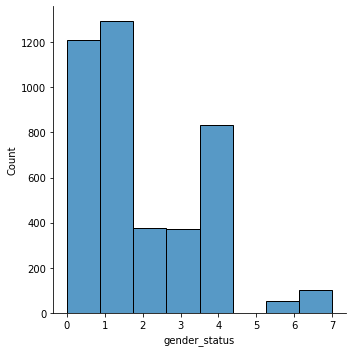

In [ ]:
#上記の可視化
sns.displot(df_train['gender_status'],bins=8)

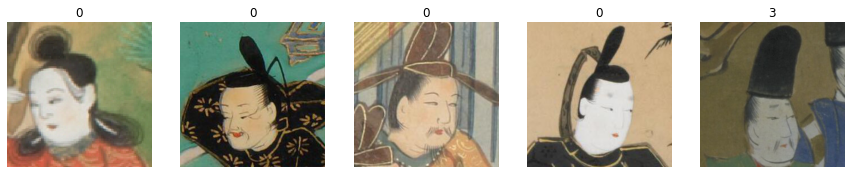

In [ ]:
#画像を描画してみる
Images = []
#dfのimage_pathを使って画像をImagesに格納する
for image in df_train['image_path'][:5].values:
  img = Image.open(image)
  Images.append(img)

#格納したうちの5枚を表示する

plt.figure(figsize=(15, 15))
for i, image in enumerate(Images[:5]):
  plt.subplot(1, 5, i+1)
  plt.title(df_train['gender_status'][i+1])
  plt.imshow(image)
  plt.axis('off')
plt.show()

### データを見た所感  
- データの偏りがすごい  
gender_status:5は1枚しかない。が、そもそも「女-武士」がいたのか気になる  
- 0:男-貴族, 1:男-武士, 3:男-庶民は比較的簡単に分類できそう  
- 2:男-化身,  6:女-化身は画像も荒く、人間の目でも判断しづらいものがあり、分類は難しそう  
- 4:女-貴族, 7:女-庶民も上記同様  
- 全体的にカテゴリに入らなそうな画像がちらほら見かけられた。  
後々はそういった曖昧な画像は抜いた方がいい結果が出るかもしれない。

gender_status:5「女-武士」がどういう画像なのか確かめる

In [ ]:
#gender_status:5にあたるデータをdataframeから取り出し
a = df_train[df_train['gender_status']==5]
a

,Unnamed: 0,image,gender_status,image_path
1547,1547,n_01919.jpg,5,/content/drive/MyDrive/compe/Nishika/JapanPic_...


In [ ]:
#画像パスを変数に
img_path_5 = df_train['image_path'][1547]
img_path_5

'/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/train/n_01919.jpg'

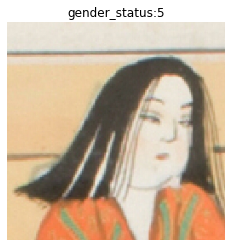

In [ ]:
#gender_status:5の画像を見てみる
img_5 = Image.open(img_path_5)
plt.title('gender_status:5')
plt.imshow(img_5)
plt.axis('off')
plt.show()

この画像だけだと判別は難しそう。。。

## 5.α. EarlyStoppingの実装  

In [5]:
#early stopping実装
#以下のgit参照（モデルの保存の部分を一部変更）
#https://github.com/Bjarten/early-stopping-pytorch/blob/master/pytorchtools.py
#日本語の説明は以下
#https://gotutiyan.hatenablog.com/entry/2021/01/30/195542

class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
            # torch.save(model.state_dict(), self.path)
            # gitでは上記でモデルのみ保存しているが、optimizer等も保存するコードに変更した
        torch.save({'model_state_dict' : model.state_dict(), #重み
                    'opt_state_dict' : optimizer.state_dict(), #optimizer
                    'loss' : epoch_loss, #損失
                    'acc' : epoch_accuracy, #正解率
                    }, self.path)
        self.val_loss_min = val_loss

## 5. データ作成、モデル生成・学習0(base）  
val_loss = 0.584933  
val_acc = 0.8275463

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [33]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        # transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        # transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [34]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [35]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state = seed)

In [36]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [37]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [38]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [39]:
#画像データは重いため、バッチサイズで小分けして処理する
torch.manual_seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

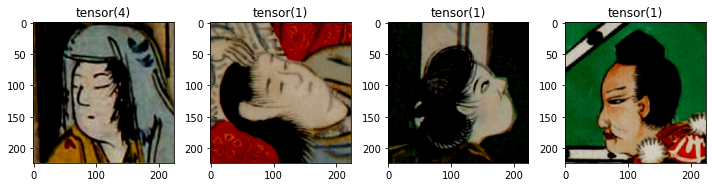

In [40]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = batch[0][i]
  image = image.numpy().transpose(1,2,0)
  label = batch[1][i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  plt.title(label)
plt.tight_layout()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [41]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [42]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [43]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [44]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [45]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_0-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.6819 - acc:0.4474 ---- val_loss:1.2518 - val_acc:0.6458



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.0317 - acc:0.6918 ---- val_loss:0.8980 - val_acc:0.7211



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:0.7382 - acc:0.7703 ---- val_loss:0.7476 - val_acc:0.7512



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.5668 - acc:0.8266 ---- val_loss:0.6834 - val_acc:0.7674



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.4453 - acc:0.8620 ---- val_loss:0.6385 - val_acc:0.7847



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.3500 - acc:0.8983 ---- val_loss:0.6157 - val_acc:0.7836



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.2706 - acc:0.9242 ---- val_loss:0.5945 - val_acc:0.7894



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.2059 - acc:0.9522 ---- val_loss:0.5870 - val_acc:0.8067



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.1587 - acc:0.9649 ---- val_loss:0.5849 - val_acc:0.8067



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.1210 - acc:0.9770 ---- val_loss:0.5883 - val_acc:0.8171

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.0960 - acc:0.9844 ---- val_loss:0.5950 - val_acc:0.8113

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.0748 - acc:0.9897 ---- val_loss:0.5936 - val_acc:0.8218

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.0583 - acc:0.9944 ---- val_loss:0.5975 - val_acc:0.8148

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.0444 - acc:0.9959 ---- val_loss:0.6014 - val_acc:0.8218

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.0371 - acc:0.9976 ---- val_loss:0.6110 - val_acc:0.8090

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.0300 - acc:0.9991 ---- val_loss:0.6170 - val_acc:0.8194

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.0222 - acc:1.0000 ---- val_loss:0.6110 - val_acc:0.8275

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.0193 - acc:0.9994 ---- val_loss:0.6103 - val_acc:0.8252

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.0153 - acc:0.9997 ---- val_loss:0.6467 - val_acc:0.8171

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

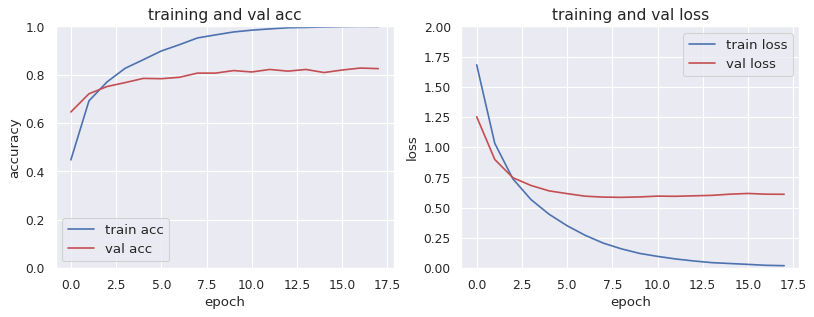

In [46]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [47]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.584933
0.8275463


## 5. データ作成、モデル生成・学習1(RandomAffine([0,30], scale=(0.8, 1.0))）  
val_loss = 0.4979412  
val_acc = 0.8425926

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [48]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        # transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [49]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [50]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [51]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [52]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [53]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [54]:
#画像データは重いため、バッチサイズで小分けして処理する
torch.manual_seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

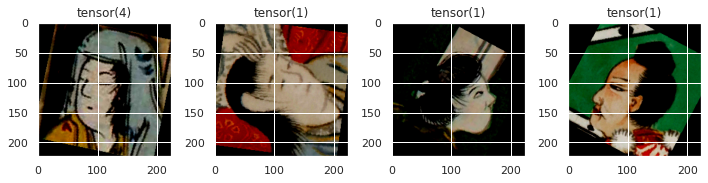

In [55]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = batch[0][i]
  image = image.numpy().transpose(1,2,0)
  label = batch[1][i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  plt.title(label)
plt.tight_layout()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [56]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [57]:
# 学習設定
epochs = 30
lr = 3e-5
gamma = 0.7

In [58]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [59]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [60]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_1-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.7260 - acc:0.4014 ---- val_loss:1.3939 - val_acc:0.5660



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.0927 - acc:0.6638 ---- val_loss:1.0167 - val_acc:0.6713



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:0.8162 - acc:0.7408 ---- val_loss:0.8228 - val_acc:0.7303



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.6643 - acc:0.7783 ---- val_loss:0.7205 - val_acc:0.7616



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.5782 - acc:0.8012 ---- val_loss:0.6573 - val_acc:0.7801



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.4997 - acc:0.8310 ---- val_loss:0.6215 - val_acc:0.7917



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.4502 - acc:0.8434 ---- val_loss:0.6160 - val_acc:0.7859



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.3950 - acc:0.8676 ---- val_loss:0.5926 - val_acc:0.7940



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.3409 - acc:0.8900 ---- val_loss:0.5675 - val_acc:0.8032



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.3093 - acc:0.9033 ---- val_loss:0.5528 - val_acc:0.8056



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.2637 - acc:0.9189 ---- val_loss:0.5257 - val_acc:0.8137



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.2254 - acc:0.9348 ---- val_loss:0.5219 - val_acc:0.8194



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.1923 - acc:0.9528 ---- val_loss:0.5377 - val_acc:0.8125

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.1722 - acc:0.9561 ---- val_loss:0.4979 - val_acc:0.8218



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.1445 - acc:0.9643 ---- val_loss:0.5127 - val_acc:0.8160

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.1221 - acc:0.9735 ---- val_loss:0.5120 - val_acc:0.8252

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.1005 - acc:0.9805 ---- val_loss:0.5226 - val_acc:0.8206

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.0947 - acc:0.9785 ---- val_loss:0.5256 - val_acc:0.8218

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.0826 - acc:0.9817 ---- val_loss:0.5123 - val_acc:0.8299

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.0692 - acc:0.9856 ---- val_loss:0.5337 - val_acc:0.8310

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.0579 - acc:0.9912 ---- val_loss:0.5208 - val_acc:0.8287

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.0514 - acc:0.9897 ---- val_loss:0.5164 - val_acc:0.8241

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.0482 - acc:0.9920 ---- val_loss:0.5130 - val_acc:0.8322

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.0437 - acc:0.9917 ---- val_loss:0.5093 - val_acc:0.8426

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

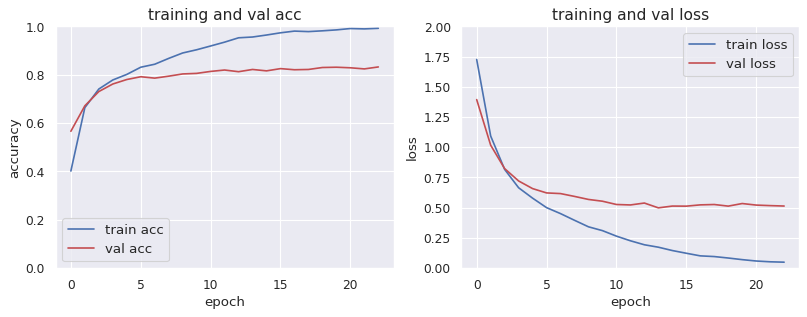

In [61]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [62]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.4979412
0.8425926


## 5. データ作成、モデル生成・学習2(RandomResizedCrop(224)）  
val_loss = 0.4961666  
val_acc = 0.8425926

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [63]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        # transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        # transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [64]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [65]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state = seed)

In [66]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [67]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [68]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [69]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [70]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [71]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [72]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [73]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_2-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.7683 - acc:0.3704 ---- val_loss:1.4158 - val_acc:0.5463



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.3413 - acc:0.5509 ---- val_loss:1.1185 - val_acc:0.6331



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.1080 - acc:0.6196 ---- val_loss:0.9354 - val_acc:0.6898



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.9516 - acc:0.6806 ---- val_loss:0.8220 - val_acc:0.7257



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.8550 - acc:0.7069 ---- val_loss:0.7683 - val_acc:0.7431



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.8146 - acc:0.7210 ---- val_loss:0.7321 - val_acc:0.7569



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.7602 - acc:0.7319 ---- val_loss:0.6967 - val_acc:0.7581



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.7157 - acc:0.7452 ---- val_loss:0.6559 - val_acc:0.7731



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.6750 - acc:0.7603 ---- val_loss:0.6420 - val_acc:0.7708



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.6550 - acc:0.7685 ---- val_loss:0.6114 - val_acc:0.7859



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.6025 - acc:0.7886 ---- val_loss:0.5927 - val_acc:0.7940



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.5864 - acc:0.7850 ---- val_loss:0.5761 - val_acc:0.7986



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.5590 - acc:0.7956 ---- val_loss:0.5627 - val_acc:0.8032



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.5424 - acc:0.8092 ---- val_loss:0.5689 - val_acc:0.7963

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.5224 - acc:0.8163 ---- val_loss:0.5478 - val_acc:0.7986



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.5148 - acc:0.8228 ---- val_loss:0.5526 - val_acc:0.8067

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.4827 - acc:0.8272 ---- val_loss:0.5386 - val_acc:0.8067



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.4591 - acc:0.8313 ---- val_loss:0.5348 - val_acc:0.8160



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.4330 - acc:0.8499 ---- val_loss:0.5283 - val_acc:0.8102



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.4220 - acc:0.8529 ---- val_loss:0.5233 - val_acc:0.8183



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.4065 - acc:0.8573 ---- val_loss:0.5304 - val_acc:0.8090

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.4031 - acc:0.8599 ---- val_loss:0.5236 - val_acc:0.8171

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.4000 - acc:0.8658 ---- val_loss:0.5258 - val_acc:0.8229

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.3882 - acc:0.8573 ---- val_loss:0.5241 - val_acc:0.8206

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.3488 - acc:0.8746 ---- val_loss:0.5094 - val_acc:0.8229



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.3442 - acc:0.8794 ---- val_loss:0.5126 - val_acc:0.8241

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.3365 - acc:0.8859 ---- val_loss:0.5288 - val_acc:0.8310

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.3240 - acc:0.8823 ---- val_loss:0.5108 - val_acc:0.8345

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.3167 - acc:0.8876 ---- val_loss:0.5041 - val_acc:0.8299



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.2945 - acc:0.8991 ---- val_loss:0.5018 - val_acc:0.8356



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.3020 - acc:0.8956 ---- val_loss:0.5042 - val_acc:0.8229

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.2839 - acc:0.9033 ---- val_loss:0.5062 - val_acc:0.8299

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.2898 - acc:0.9036 ---- val_loss:0.4999 - val_acc:0.8380



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.2736 - acc:0.9089 ---- val_loss:0.5284 - val_acc:0.8229

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.2547 - acc:0.9159 ---- val_loss:0.5227 - val_acc:0.8264

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.2564 - acc:0.9112 ---- val_loss:0.5115 - val_acc:0.8229

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.2604 - acc:0.9145 ---- val_loss:0.5267 - val_acc:0.8218

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.2702 - acc:0.9053 ---- val_loss:0.4962 - val_acc:0.8368



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.2472 - acc:0.9210 ---- val_loss:0.5039 - val_acc:0.8310

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.2458 - acc:0.9180 ---- val_loss:0.4995 - val_acc:0.8426

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.2197 - acc:0.9271 ---- val_loss:0.5212 - val_acc:0.8264

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.2167 - acc:0.9260 ---- val_loss:0.5236 - val_acc:0.8252

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.2324 - acc:0.9180 ---- val_loss:0.5172 - val_acc:0.8310

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.2246 - acc:0.9263 ---- val_loss:0.5164 - val_acc:0.8310

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:45 - loss:0.2171 - acc:0.9266 ---- val_loss:0.5403 - val_acc:0.8252

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:46 - loss:0.2242 - acc:0.9263 ---- val_loss:0.5142 - val_acc:0.8322

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:47 - loss:0.2142 - acc:0.9248 ---- val_loss:0.5321 - val_acc:0.8287

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:48 - loss:0.2063 - acc:0.9336 ---- val_loss:0.5129 - val_acc:0.8356

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

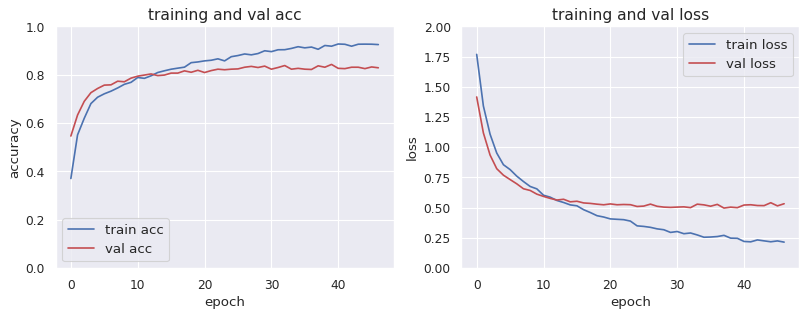

In [74]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [75]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.4961666
0.8425926


## 5. データ作成、モデル生成・学習3(RandomHorizontalFlip(p=0.5)）  
val_loss = 0.49776137  
val_acc = 0.84375 

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [76]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        # transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [77]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [78]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [79]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [80]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [81]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [82]:
#画像データは重いため、バッチサイズで小分けして処理する
torch.manual_seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

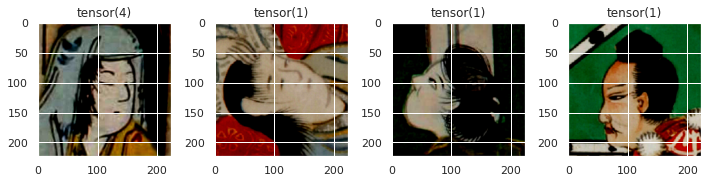

In [83]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = batch[0][i]
  image = image.numpy().transpose(1,2,0)
  label = batch[1][i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  plt.title(label)
plt.tight_layout()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [84]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [85]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [86]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [87]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [88]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_3-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(42)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.6945 - acc:0.4356 ---- val_loss:1.2640 - val_acc:0.6157



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.0755 - acc:0.6809 ---- val_loss:0.9062 - val_acc:0.7164



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:0.7908 - acc:0.7446 ---- val_loss:0.7429 - val_acc:0.7500



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.6422 - acc:0.7921 ---- val_loss:0.6622 - val_acc:0.7731



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.5303 - acc:0.8296 ---- val_loss:0.6190 - val_acc:0.7836



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.4514 - acc:0.8528 ---- val_loss:0.5790 - val_acc:0.7998



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.3802 - acc:0.8803 ---- val_loss:0.5670 - val_acc:0.7963



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.3224 - acc:0.8979 ---- val_loss:0.5421 - val_acc:0.8067



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.2824 - acc:0.9151 ---- val_loss:0.5271 - val_acc:0.8137



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.2255 - acc:0.9325 ---- val_loss:0.5219 - val_acc:0.8252



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.1830 - acc:0.9522 ---- val_loss:0.5201 - val_acc:0.8229



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.1510 - acc:0.9667 ---- val_loss:0.5060 - val_acc:0.8206



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.1291 - acc:0.9729 ---- val_loss:0.5082 - val_acc:0.8310

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.1072 - acc:0.9776 ---- val_loss:0.5085 - val_acc:0.8299

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.0877 - acc:0.9838 ---- val_loss:0.5106 - val_acc:0.8287

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.0699 - acc:0.9915 ---- val_loss:0.4978 - val_acc:0.8345



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.0579 - acc:0.9926 ---- val_loss:0.5028 - val_acc:0.8414

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.0512 - acc:0.9935 ---- val_loss:0.5055 - val_acc:0.8333

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.0377 - acc:0.9973 ---- val_loss:0.5405 - val_acc:0.8403

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.0363 - acc:0.9962 ---- val_loss:0.5369 - val_acc:0.8322

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.0277 - acc:0.9982 ---- val_loss:0.5145 - val_acc:0.8414

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.0246 - acc:0.9985 ---- val_loss:0.5230 - val_acc:0.8403

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.0221 - acc:0.9991 ---- val_loss:0.5463 - val_acc:0.8403

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.0178 - acc:0.9991 ---- val_loss:0.5399 - val_acc:0.8403

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.0176 - acc:0.9994 ---- val_loss:0.5625 - val_acc:0.8380

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.0141 - acc:0.9997 ---- val_loss:0.5448 - val_acc:0.8438

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

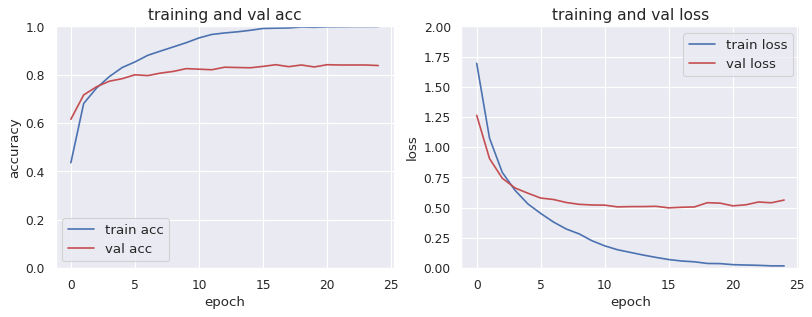

In [89]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [90]:
acc_3 = max(val_acc_list).to(device2).numpy()
loss_3 = min(val_loss_list).to(device2).numpy()
print(acc_3)
print(loss_3)

0.84375
0.49776137


## 5. データ作成、モデル生成・学習4(RandomErasing）  
val_loss = 0.54302365  
val_acc = 0.8414352

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [91]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        # transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        # transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [92]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [93]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [94]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [95]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [96]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [97]:
#画像データは重いため、バッチサイズで小分けして処理する
torch.manual_seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

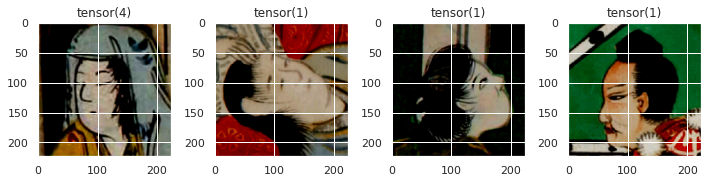

In [98]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = batch[0][i]
  image = image.numpy().transpose(1,2,0)
  label = batch[1][i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  plt.title(label)
plt.tight_layout()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [99]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [100]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [101]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [102]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [103]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_4-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0
    best_loss = 0
    best_acc = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.6979 - acc:0.4273 ---- val_loss:1.2229 - val_acc:0.6516



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.0828 - acc:0.6841 ---- val_loss:0.9002 - val_acc:0.7199



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:0.7883 - acc:0.7493 ---- val_loss:0.7399 - val_acc:0.7523



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.6231 - acc:0.8048 ---- val_loss:0.6758 - val_acc:0.7616



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.5168 - acc:0.8337 ---- val_loss:0.6275 - val_acc:0.7905



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.4157 - acc:0.8702 ---- val_loss:0.5948 - val_acc:0.7975



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.3350 - acc:0.9018 ---- val_loss:0.5886 - val_acc:0.8032



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.2846 - acc:0.9186 ---- val_loss:0.5693 - val_acc:0.8137



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.2298 - acc:0.9398 ---- val_loss:0.5616 - val_acc:0.8125



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.1957 - acc:0.9472 ---- val_loss:0.5490 - val_acc:0.8206



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.1681 - acc:0.9599 ---- val_loss:0.5509 - val_acc:0.8252

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.1378 - acc:0.9670 ---- val_loss:0.5430 - val_acc:0.8287



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.1203 - acc:0.9720 ---- val_loss:0.5604 - val_acc:0.8275

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.1025 - acc:0.9752 ---- val_loss:0.5587 - val_acc:0.8333

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.0845 - acc:0.9797 ---- val_loss:0.5621 - val_acc:0.8380

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.0783 - acc:0.9838 ---- val_loss:0.5508 - val_acc:0.8333

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.0733 - acc:0.9847 ---- val_loss:0.5641 - val_acc:0.8368

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.0659 - acc:0.9858 ---- val_loss:0.5834 - val_acc:0.8356

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.0580 - acc:0.9861 ---- val_loss:0.5597 - val_acc:0.8333

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.0570 - acc:0.9867 ---- val_loss:0.5748 - val_acc:0.8322

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.0481 - acc:0.9897 ---- val_loss:0.5544 - val_acc:0.8414

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.0459 - acc:0.9909 ---- val_loss:0.5569 - val_acc:0.8356

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

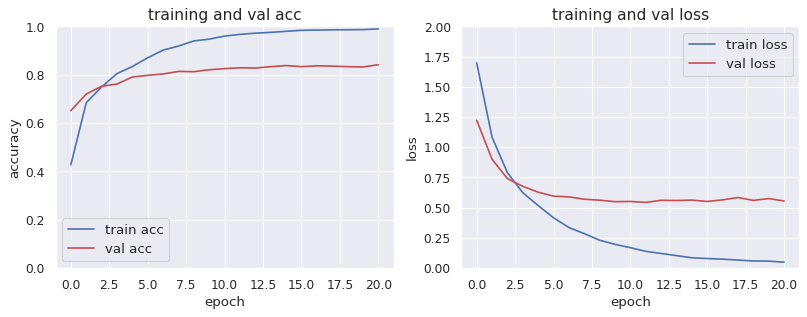

In [104]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [105]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.54302365
0.8414352


## 5. データ作成、モデル生成・学習5(mixup0.4）  
val_locc = 0.48499423  
val_acc = 0.85069436

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [106]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        # transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        # transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ランダムな箇所を黒塗りにする
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


In [107]:
#Mixupの実装
#https://qiita.com/karaage0703/items/9b56a68a5dba4ad330d9
def mixup_data(x, y, alpha=1.0, use_cuda=True):
    '''Compute the mixup data. Return mixed inputs, pairs of targets, and lambda'''
    if alpha > 0.:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.
    batch_size = x.size()[0]
    if use_cuda:
        index = torch.randperm(batch_size).cuda()
    else:
        index = torch.randperm(batch_size)

    mixed_x = lam * x + (1 - lam) * x[index,:]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

#カテゴリー変数をone-hotに変換し、mixupに適用
def mixup_criterion(y_a, y_b, lam):
    return lambda criterion, pred: lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [108]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [109]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [110]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [111]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [112]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [113]:
#画像データは重いため、バッチサイズで小分けして処理する
np.random.seed(seed)
torch.manual_seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

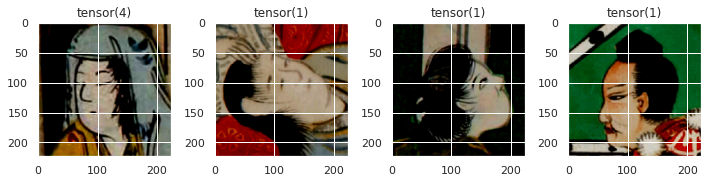

In [114]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = batch[0][i]
  image = image.numpy().transpose(1,2,0)
  label = batch[1][i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  plt.title(label)
plt.tight_layout()
plt.show()

In [115]:
#Mixupの適用
data,target_a,target_b,lam = mixup_data(batch[0], batch[1], alpha=0.4, use_cuda=torch.cuda.is_available())
data = data
label = target_a # target_aへ書換え

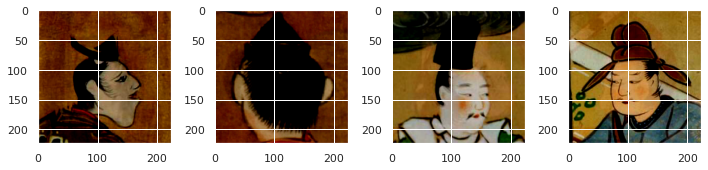

In [116]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = data[i]
  image = image.numpy().transpose(1,2,0)
  # label = label[i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  # plt.title(label)
plt.tight_layout()
plt.show()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [117]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [118]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [119]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [120]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [121]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_5-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
np.random.seed(seed) #mixupを実装する際はnp.randomもここで定義し直す
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # ↓mixup用にここを変更
        data,target_a,target_b,lam = mixup_data(data, label, alpha=0.4, use_cuda=torch.cuda.is_available())
        data = data.to(device)
        label = target_a.to(device) # target_aへ書換え
        # ここまで変更

        output = model(data)
        #mixup用のlossを実装
        loss_func = mixup_criterion(target_a, target_b, lam)
        loss = loss_func(criterion, output)
        # output = model(data)
        # loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.7542 - acc:0.3406 ---- val_loss:1.2815 - val_acc:0.6169



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.2597 - acc:0.4400 ---- val_loss:0.9377 - val_acc:0.7083



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.0665 - acc:0.4736 ---- val_loss:0.8027 - val_acc:0.7419



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.9430 - acc:0.4958 ---- val_loss:0.7286 - val_acc:0.7650



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.8609 - acc:0.5475 ---- val_loss:0.6711 - val_acc:0.7905



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.8704 - acc:0.5236 ---- val_loss:0.6494 - val_acc:0.7986



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.7885 - acc:0.5521 ---- val_loss:0.6148 - val_acc:0.8032



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.7855 - acc:0.5632 ---- val_loss:0.6065 - val_acc:0.8090



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.7147 - acc:0.5418 ---- val_loss:0.5839 - val_acc:0.8090



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.6999 - acc:0.6316 ---- val_loss:0.5726 - val_acc:0.8194



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.6528 - acc:0.5941 ---- val_loss:0.5485 - val_acc:0.8218



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.5851 - acc:0.6107 ---- val_loss:0.5433 - val_acc:0.8252



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.6454 - acc:0.6123 ---- val_loss:0.5551 - val_acc:0.8194

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.6092 - acc:0.6195 ---- val_loss:0.5397 - val_acc:0.8229



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.6245 - acc:0.6008 ---- val_loss:0.5403 - val_acc:0.8264

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.5527 - acc:0.6315 ---- val_loss:0.5325 - val_acc:0.8264



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.5887 - acc:0.6569 ---- val_loss:0.5294 - val_acc:0.8310



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.6354 - acc:0.5893 ---- val_loss:0.5328 - val_acc:0.8264

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.5852 - acc:0.6316 ---- val_loss:0.5311 - val_acc:0.8264

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.5195 - acc:0.5756 ---- val_loss:0.5154 - val_acc:0.8322



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.5482 - acc:0.6365 ---- val_loss:0.5042 - val_acc:0.8391



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.5433 - acc:0.5812 ---- val_loss:0.5140 - val_acc:0.8275

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.5499 - acc:0.6331 ---- val_loss:0.5061 - val_acc:0.8356

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.4808 - acc:0.6115 ---- val_loss:0.5049 - val_acc:0.8333

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.5119 - acc:0.5906 ---- val_loss:0.4995 - val_acc:0.8403



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.5174 - acc:0.6177 ---- val_loss:0.4850 - val_acc:0.8380



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.5086 - acc:0.6149 ---- val_loss:0.4958 - val_acc:0.8472

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.5264 - acc:0.6889 ---- val_loss:0.5118 - val_acc:0.8495

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.5075 - acc:0.6245 ---- val_loss:0.4974 - val_acc:0.8507

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.5375 - acc:0.5900 ---- val_loss:0.5064 - val_acc:0.8414

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.5522 - acc:0.5832 ---- val_loss:0.4975 - val_acc:0.8484

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.4737 - acc:0.6125 ---- val_loss:0.5053 - val_acc:0.8449

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.5014 - acc:0.6781 ---- val_loss:0.4957 - val_acc:0.8484

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.4996 - acc:0.6173 ---- val_loss:0.4972 - val_acc:0.8461

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.4949 - acc:0.6023 ---- val_loss:0.4946 - val_acc:0.8484

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.5282 - acc:0.6162 ---- val_loss:0.4893 - val_acc:0.8461

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

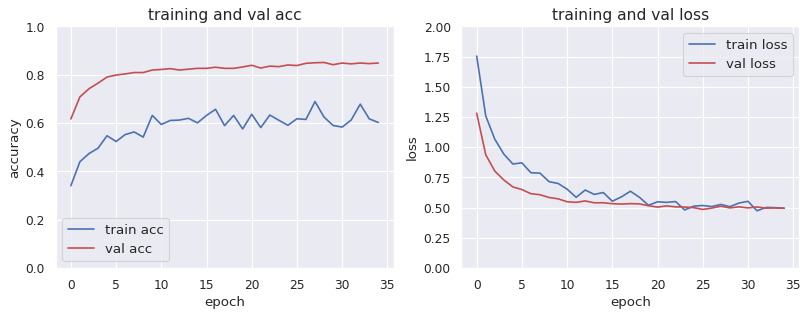

In [122]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [123]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.48499423
0.85069436


## 5. データ作成、モデル生成・学習6(All）  
val_loss = 0.43315852  
val_acc = 0.8738425

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [124]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


In [125]:
#Mixupの実装
#https://qiita.com/karaage0703/items/9b56a68a5dba4ad330d9
def mixup_data(x, y, alpha=1.0, use_cuda=True):

    '''Compute the mixup data. Return mixed inputs, pairs of targets, and lambda'''
    if alpha > 0.:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.
    batch_size = x.size()[0]
    if use_cuda:
        index = torch.randperm(batch_size).cuda()
    else:
        index = torch.randperm(batch_size)

    mixed_x = lam * x + (1 - lam) * x[index,:]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

#カテゴリー変数をone-hotに変換し、mixupに適用
def mixup_criterion(y_a, y_b, lam):
    return lambda criterion, pred: lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [126]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [127]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [128]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [129]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [130]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [131]:
#画像データは重いため、バッチサイズで小分けして処理する
torch.manual_seed(seed)
np.random.seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

In [132]:
#Mixupの適用
data,target_a,target_b,lam = mixup_data(batch[0], batch[1], alpha=0.4, use_cuda=torch.cuda.is_available())
data = data
label = target_a # target_aへ書換え

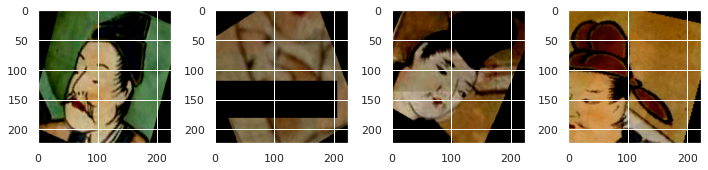

In [133]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = data[i]
  image = image.numpy().transpose(1,2,0)
  # label = label[i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  # plt.title(label)
plt.tight_layout()
plt.show()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [134]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [135]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [136]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [137]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [138]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_6-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
np.random.seed(seed) #mixupを実装する際はnp.randomもここで定義し直す
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # ↓mixup用にここを変更
        data,target_a,target_b,lam = mixup_data(data, label, alpha=0.4, use_cuda=torch.cuda.is_available())
        data = data.to(device)
        label = target_a.to(device) # target_aへ書換え
        # ここまで変更

        output = model(data)
        #mixup用のlossを実装
        loss_func = mixup_criterion(target_a, target_b, lam)
        loss = loss_func(criterion, output)
        # output = model(data)
        # loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.8954 - acc:0.2642 ---- val_loss:1.5044 - val_acc:0.5417



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.5166 - acc:0.3799 ---- val_loss:1.1966 - val_acc:0.6366



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.3383 - acc:0.4001 ---- val_loss:1.0458 - val_acc:0.6678



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:1.2545 - acc:0.4150 ---- val_loss:0.9504 - val_acc:0.7083



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:1.1890 - acc:0.4736 ---- val_loss:0.8564 - val_acc:0.7176



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:1.1601 - acc:0.4606 ---- val_loss:0.8257 - val_acc:0.7338



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:1.1317 - acc:0.4610 ---- val_loss:0.8010 - val_acc:0.7350



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:1.1083 - acc:0.4780 ---- val_loss:0.7619 - val_acc:0.7569



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:1.0926 - acc:0.4627 ---- val_loss:0.7598 - val_acc:0.7604



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:1.0526 - acc:0.5166 ---- val_loss:0.7153 - val_acc:0.7604



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:1.0236 - acc:0.4833 ---- val_loss:0.6947 - val_acc:0.7708



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.9846 - acc:0.5124 ---- val_loss:0.6970 - val_acc:0.7731

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:1.0240 - acc:0.5206 ---- val_loss:0.6597 - val_acc:0.7847



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.9871 - acc:0.5060 ---- val_loss:0.6316 - val_acc:0.7951



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.9954 - acc:0.4995 ---- val_loss:0.6485 - val_acc:0.7824

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.9624 - acc:0.5332 ---- val_loss:0.6336 - val_acc:0.7894

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.9816 - acc:0.5399 ---- val_loss:0.6247 - val_acc:0.7963



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.9937 - acc:0.5094 ---- val_loss:0.6352 - val_acc:0.7975

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.9764 - acc:0.5240 ---- val_loss:0.6067 - val_acc:0.8009



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.9097 - acc:0.4983 ---- val_loss:0.5925 - val_acc:0.7998



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.9287 - acc:0.5392 ---- val_loss:0.5975 - val_acc:0.8090

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.9189 - acc:0.4924 ---- val_loss:0.6018 - val_acc:0.8090

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.9255 - acc:0.5264 ---- val_loss:0.5724 - val_acc:0.8171



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.8913 - acc:0.5163 ---- val_loss:0.5606 - val_acc:0.8171



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.8911 - acc:0.5080 ---- val_loss:0.5568 - val_acc:0.8148



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.8906 - acc:0.5269 ---- val_loss:0.5489 - val_acc:0.8264



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.8602 - acc:0.5380 ---- val_loss:0.5576 - val_acc:0.8113

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.8715 - acc:0.5871 ---- val_loss:0.5533 - val_acc:0.8056

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.8715 - acc:0.5387 ---- val_loss:0.5414 - val_acc:0.8206



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.8963 - acc:0.5004 ---- val_loss:0.5425 - val_acc:0.8275

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.8881 - acc:0.5068 ---- val_loss:0.5346 - val_acc:0.8264



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.8185 - acc:0.5228 ---- val_loss:0.5311 - val_acc:0.8322



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.8533 - acc:0.5767 ---- val_loss:0.5277 - val_acc:0.8299



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.8575 - acc:0.5403 ---- val_loss:0.5178 - val_acc:0.8310



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.8490 - acc:0.5318 ---- val_loss:0.5174 - val_acc:0.8194



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.8708 - acc:0.5384 ---- val_loss:0.5136 - val_acc:0.8299



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.8919 - acc:0.5108 ---- val_loss:0.5288 - val_acc:0.8206

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.8351 - acc:0.5411 ---- val_loss:0.5063 - val_acc:0.8218



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.8734 - acc:0.5402 ---- val_loss:0.5254 - val_acc:0.8218

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.8251 - acc:0.5225 ---- val_loss:0.5081 - val_acc:0.8287

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.8221 - acc:0.5713 ---- val_loss:0.5123 - val_acc:0.8229

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.8453 - acc:0.5791 ---- val_loss:0.5101 - val_acc:0.8322

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.8963 - acc:0.5452 ---- val_loss:0.5203 - val_acc:0.8287

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.7872 - acc:0.5734 ---- val_loss:0.5100 - val_acc:0.8275

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:45 - loss:0.8098 - acc:0.5515 ---- val_loss:0.5091 - val_acc:0.8252

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:46 - loss:0.7670 - acc:0.5706 ---- val_loss:0.4931 - val_acc:0.8333



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:47 - loss:0.8333 - acc:0.5570 ---- val_loss:0.5062 - val_acc:0.8218

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:48 - loss:0.7542 - acc:0.5342 ---- val_loss:0.4848 - val_acc:0.8403



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:49 - loss:0.7778 - acc:0.5575 ---- val_loss:0.4830 - val_acc:0.8345



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:50 - loss:0.7753 - acc:0.5563 ---- val_loss:0.4788 - val_acc:0.8391



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:51 - loss:0.8132 - acc:0.5647 ---- val_loss:0.4962 - val_acc:0.8287

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:52 - loss:0.8443 - acc:0.5736 ---- val_loss:0.4947 - val_acc:0.8403

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:53 - loss:0.7487 - acc:0.5617 ---- val_loss:0.4770 - val_acc:0.8403



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:54 - loss:0.7766 - acc:0.5212 ---- val_loss:0.4755 - val_acc:0.8449



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:55 - loss:0.8029 - acc:0.4961 ---- val_loss:0.4924 - val_acc:0.8345

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:56 - loss:0.7664 - acc:0.6093 ---- val_loss:0.4741 - val_acc:0.8449



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:57 - loss:0.7857 - acc:0.5878 ---- val_loss:0.4742 - val_acc:0.8461

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:58 - loss:0.7493 - acc:0.5357 ---- val_loss:0.4799 - val_acc:0.8403

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:59 - loss:0.7908 - acc:0.5477 ---- val_loss:0.4799 - val_acc:0.8438

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:60 - loss:0.7701 - acc:0.5531 ---- val_loss:0.4707 - val_acc:0.8472



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:61 - loss:0.7548 - acc:0.5328 ---- val_loss:0.4698 - val_acc:0.8553



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:62 - loss:0.7148 - acc:0.5754 ---- val_loss:0.4623 - val_acc:0.8495



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:63 - loss:0.7377 - acc:0.6015 ---- val_loss:0.4493 - val_acc:0.8495



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:64 - loss:0.6953 - acc:0.5592 ---- val_loss:0.4662 - val_acc:0.8449

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:65 - loss:0.7642 - acc:0.6117 ---- val_loss:0.4580 - val_acc:0.8634

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:66 - loss:0.7490 - acc:0.5160 ---- val_loss:0.4589 - val_acc:0.8553

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:67 - loss:0.7571 - acc:0.5412 ---- val_loss:0.4680 - val_acc:0.8576

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:68 - loss:0.7973 - acc:0.5918 ---- val_loss:0.4739 - val_acc:0.8484

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:69 - loss:0.7160 - acc:0.5855 ---- val_loss:0.4664 - val_acc:0.8495

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:70 - loss:0.7804 - acc:0.5339 ---- val_loss:0.4452 - val_acc:0.8588



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:71 - loss:0.7648 - acc:0.5458 ---- val_loss:0.4718 - val_acc:0.8495

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:72 - loss:0.7685 - acc:0.5245 ---- val_loss:0.4831 - val_acc:0.8495

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:73 - loss:0.7403 - acc:0.5468 ---- val_loss:0.4580 - val_acc:0.8542

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:74 - loss:0.6736 - acc:0.5378 ---- val_loss:0.4440 - val_acc:0.8692



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:75 - loss:0.8016 - acc:0.5110 ---- val_loss:0.4578 - val_acc:0.8623

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:76 - loss:0.6698 - acc:0.5607 ---- val_loss:0.4433 - val_acc:0.8623



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:77 - loss:0.6950 - acc:0.5731 ---- val_loss:0.4559 - val_acc:0.8542

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:78 - loss:0.7703 - acc:0.5695 ---- val_loss:0.4685 - val_acc:0.8565

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:79 - loss:0.7544 - acc:0.5932 ---- val_loss:0.4547 - val_acc:0.8634

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:80 - loss:0.6789 - acc:0.5949 ---- val_loss:0.4417 - val_acc:0.8657



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:81 - loss:0.7392 - acc:0.6217 ---- val_loss:0.4390 - val_acc:0.8738



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:82 - loss:0.7063 - acc:0.5735 ---- val_loss:0.4548 - val_acc:0.8657

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:83 - loss:0.7569 - acc:0.5717 ---- val_loss:0.4511 - val_acc:0.8692

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:84 - loss:0.7098 - acc:0.6379 ---- val_loss:0.4470 - val_acc:0.8692

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:85 - loss:0.6639 - acc:0.5865 ---- val_loss:0.4332 - val_acc:0.8611



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:86 - loss:0.7006 - acc:0.5643 ---- val_loss:0.4351 - val_acc:0.8576

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:87 - loss:0.6387 - acc:0.5979 ---- val_loss:0.4509 - val_acc:0.8600

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:88 - loss:0.7235 - acc:0.6050 ---- val_loss:0.4460 - val_acc:0.8669

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:89 - loss:0.7098 - acc:0.5968 ---- val_loss:0.4471 - val_acc:0.8692

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:90 - loss:0.7241 - acc:0.5602 ---- val_loss:0.4820 - val_acc:0.8507

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:91 - loss:0.6925 - acc:0.6043 ---- val_loss:0.4429 - val_acc:0.8646

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:92 - loss:0.6816 - acc:0.5295 ---- val_loss:0.4599 - val_acc:0.8600

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:93 - loss:0.7144 - acc:0.6143 ---- val_loss:0.4540 - val_acc:0.8623

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:94 - loss:0.6490 - acc:0.5887 ---- val_loss:0.4507 - val_acc:0.8611

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:95 - loss:0.6891 - acc:0.5651 ---- val_loss:0.4604 - val_acc:0.8507

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

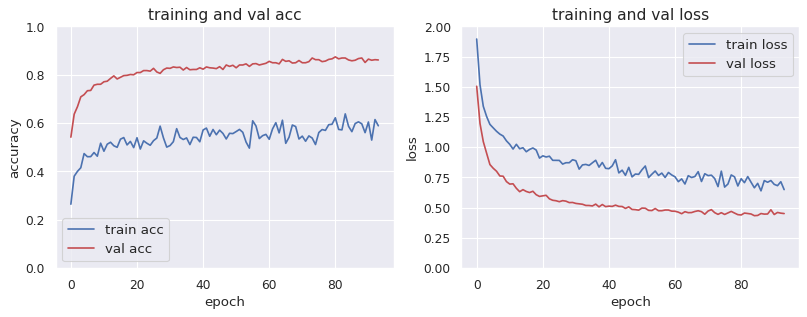

In [139]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [140]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.43315852
0.8738425


## 5. データ作成、モデル生成・学習7(mixup,erasing以外）  
val_loss = 0.48067275  
val_acc = 0.849537

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [141]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [142]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [143]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [144]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [145]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [146]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [147]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [148]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [149]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [150]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [151]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_7-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.9244 - acc:0.3100 ---- val_loss:1.5400 - val_acc:0.5289



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.4228 - acc:0.5337 ---- val_loss:1.1775 - val_acc:0.6343



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.1426 - acc:0.6264 ---- val_loss:0.9923 - val_acc:0.6910



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:1.0117 - acc:0.6561 ---- val_loss:0.8704 - val_acc:0.7269



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.9261 - acc:0.6821 ---- val_loss:0.7893 - val_acc:0.7442



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.8620 - acc:0.7025 ---- val_loss:0.7452 - val_acc:0.7604



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.8081 - acc:0.7143 ---- val_loss:0.7140 - val_acc:0.7720



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.7525 - acc:0.7346 ---- val_loss:0.6829 - val_acc:0.7731



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.7398 - acc:0.7411 ---- val_loss:0.6461 - val_acc:0.7778



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.7122 - acc:0.7428 ---- val_loss:0.6339 - val_acc:0.7766



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.6665 - acc:0.7623 ---- val_loss:0.6232 - val_acc:0.7801



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.6661 - acc:0.7644 ---- val_loss:0.6065 - val_acc:0.7813



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.6304 - acc:0.7741 ---- val_loss:0.6073 - val_acc:0.7847

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.6012 - acc:0.7806 ---- val_loss:0.5712 - val_acc:0.7905



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.5910 - acc:0.7839 ---- val_loss:0.5759 - val_acc:0.8021

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.5791 - acc:0.7797 ---- val_loss:0.5603 - val_acc:0.8056



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.5568 - acc:0.7974 ---- val_loss:0.5542 - val_acc:0.8090



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.5425 - acc:0.8074 ---- val_loss:0.5610 - val_acc:0.8056

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.5324 - acc:0.8027 ---- val_loss:0.5551 - val_acc:0.8102

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.4939 - acc:0.8275 ---- val_loss:0.5455 - val_acc:0.8090



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.5022 - acc:0.8131 ---- val_loss:0.5273 - val_acc:0.8079



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.4838 - acc:0.8257 ---- val_loss:0.5110 - val_acc:0.8252



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.4803 - acc:0.8281 ---- val_loss:0.5178 - val_acc:0.8264

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.4668 - acc:0.8334 ---- val_loss:0.5115 - val_acc:0.8299

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.4669 - acc:0.8287 ---- val_loss:0.5073 - val_acc:0.8356



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.4563 - acc:0.8407 ---- val_loss:0.5165 - val_acc:0.8310

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.4293 - acc:0.8479 ---- val_loss:0.5072 - val_acc:0.8299



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.4297 - acc:0.8455 ---- val_loss:0.5088 - val_acc:0.8252

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.4331 - acc:0.8402 ---- val_loss:0.5005 - val_acc:0.8287



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.4131 - acc:0.8543 ---- val_loss:0.4863 - val_acc:0.8333



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.3867 - acc:0.8637 ---- val_loss:0.5035 - val_acc:0.8310

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.3827 - acc:0.8644 ---- val_loss:0.4988 - val_acc:0.8356

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.3717 - acc:0.8735 ---- val_loss:0.5105 - val_acc:0.8345

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.3715 - acc:0.8697 ---- val_loss:0.5037 - val_acc:0.8310

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.3661 - acc:0.8697 ---- val_loss:0.5023 - val_acc:0.8380

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.3447 - acc:0.8782 ---- val_loss:0.4852 - val_acc:0.8426



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.3437 - acc:0.8832 ---- val_loss:0.5143 - val_acc:0.8403

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.3642 - acc:0.8705 ---- val_loss:0.4982 - val_acc:0.8426

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.3252 - acc:0.8891 ---- val_loss:0.4974 - val_acc:0.8391

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.3181 - acc:0.8935 ---- val_loss:0.4807 - val_acc:0.8438



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.3079 - acc:0.8973 ---- val_loss:0.5237 - val_acc:0.8403

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.3139 - acc:0.8888 ---- val_loss:0.4889 - val_acc:0.8449

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.3205 - acc:0.8850 ---- val_loss:0.5111 - val_acc:0.8391

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.3279 - acc:0.8882 ---- val_loss:0.5178 - val_acc:0.8333

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:45 - loss:0.2948 - acc:0.9003 ---- val_loss:0.4984 - val_acc:0.8461

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:46 - loss:0.2793 - acc:0.9098 ---- val_loss:0.4934 - val_acc:0.8461

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:47 - loss:0.2868 - acc:0.8944 ---- val_loss:0.4816 - val_acc:0.8495

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:48 - loss:0.2859 - acc:0.8944 ---- val_loss:0.5006 - val_acc:0.8438

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:49 - loss:0.2936 - acc:0.8989 ---- val_loss:0.4983 - val_acc:0.8414

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:50 - loss:0.2921 - acc:0.8976 ---- val_loss:0.5106 - val_acc:0.8368

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

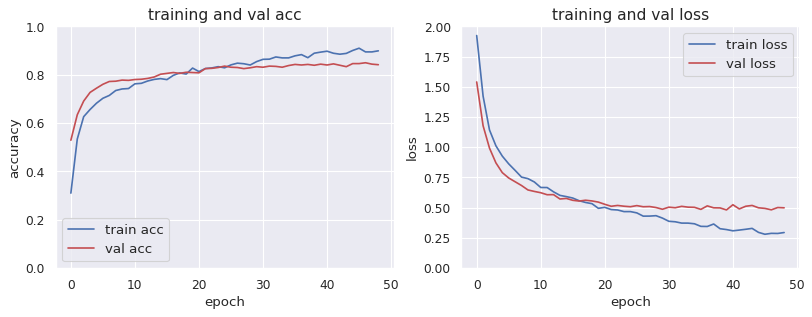

In [152]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [153]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.48067275
0.849537


## 5. データ作成、モデル生成・学習8(mixup以外）  
val_loss = 0.43720686  
val_acc = 0.8587963

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [165]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [166]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [167]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [168]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [169]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [170]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

### 6. timmのresnet18で画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [171]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [172]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [173]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [174]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [175]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_8-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.8698 - acc:0.3230 ---- val_loss:1.5160 - val_acc:0.5509



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.4031 - acc:0.5296 ---- val_loss:1.1680 - val_acc:0.6192



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.1663 - acc:0.5978 ---- val_loss:0.9931 - val_acc:0.6725



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:1.0304 - acc:0.6364 ---- val_loss:0.8843 - val_acc:0.7049



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.9426 - acc:0.6685 ---- val_loss:0.8070 - val_acc:0.7257



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.8750 - acc:0.6857 ---- val_loss:0.7462 - val_acc:0.7419



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.8390 - acc:0.7019 ---- val_loss:0.7091 - val_acc:0.7569



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.7987 - acc:0.7107 ---- val_loss:0.6782 - val_acc:0.7616



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.7608 - acc:0.7257 ---- val_loss:0.6528 - val_acc:0.7755



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.7374 - acc:0.7414 ---- val_loss:0.6422 - val_acc:0.7650



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.7072 - acc:0.7402 ---- val_loss:0.6178 - val_acc:0.7743



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.6788 - acc:0.7514 ---- val_loss:0.6050 - val_acc:0.7847



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.6778 - acc:0.7576 ---- val_loss:0.5961 - val_acc:0.7917



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.6431 - acc:0.7638 ---- val_loss:0.5882 - val_acc:0.7928



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.6258 - acc:0.7747 ---- val_loss:0.5831 - val_acc:0.8032



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.5942 - acc:0.7853 ---- val_loss:0.5639 - val_acc:0.8009



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.5908 - acc:0.7910 ---- val_loss:0.5698 - val_acc:0.7975

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.5877 - acc:0.7821 ---- val_loss:0.5575 - val_acc:0.7998



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.5614 - acc:0.7889 ---- val_loss:0.5332 - val_acc:0.8079



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.5319 - acc:0.8054 ---- val_loss:0.5427 - val_acc:0.8067

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.5514 - acc:0.8021 ---- val_loss:0.5224 - val_acc:0.8137



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.5255 - acc:0.8172 ---- val_loss:0.5263 - val_acc:0.8171

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.5237 - acc:0.8128 ---- val_loss:0.5204 - val_acc:0.8148



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.5089 - acc:0.8148 ---- val_loss:0.5086 - val_acc:0.8241



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.4674 - acc:0.8319 ---- val_loss:0.5016 - val_acc:0.8241



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.4735 - acc:0.8251 ---- val_loss:0.4909 - val_acc:0.8299



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.4761 - acc:0.8301 ---- val_loss:0.4947 - val_acc:0.8299

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.4626 - acc:0.8334 ---- val_loss:0.4874 - val_acc:0.8241



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.4688 - acc:0.8257 ---- val_loss:0.4942 - val_acc:0.8287

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.4225 - acc:0.8517 ---- val_loss:0.4721 - val_acc:0.8333



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.4285 - acc:0.8531 ---- val_loss:0.5076 - val_acc:0.8252

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.4278 - acc:0.8534 ---- val_loss:0.4835 - val_acc:0.8368

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.4057 - acc:0.8549 ---- val_loss:0.4610 - val_acc:0.8414



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.4157 - acc:0.8529 ---- val_loss:0.4742 - val_acc:0.8356

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.3907 - acc:0.8614 ---- val_loss:0.4726 - val_acc:0.8333

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.4006 - acc:0.8620 ---- val_loss:0.4870 - val_acc:0.8333

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.3849 - acc:0.8608 ---- val_loss:0.4687 - val_acc:0.8368

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.3805 - acc:0.8614 ---- val_loss:0.4522 - val_acc:0.8438



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.3656 - acc:0.8738 ---- val_loss:0.4680 - val_acc:0.8426

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.3666 - acc:0.8682 ---- val_loss:0.4672 - val_acc:0.8403

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.3550 - acc:0.8737 ---- val_loss:0.4808 - val_acc:0.8322

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.3329 - acc:0.8835 ---- val_loss:0.4626 - val_acc:0.8438

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.3453 - acc:0.8747 ---- val_loss:0.4685 - val_acc:0.8426

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.3305 - acc:0.8886 ---- val_loss:0.4673 - val_acc:0.8519

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:45 - loss:0.3341 - acc:0.8838 ---- val_loss:0.4683 - val_acc:0.8461

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:46 - loss:0.3233 - acc:0.8823 ---- val_loss:0.4425 - val_acc:0.8542



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:47 - loss:0.3249 - acc:0.8885 ---- val_loss:0.4587 - val_acc:0.8403

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:48 - loss:0.3069 - acc:0.8965 ---- val_loss:0.4422 - val_acc:0.8542



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:49 - loss:0.3263 - acc:0.8853 ---- val_loss:0.4466 - val_acc:0.8588

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:50 - loss:0.2963 - acc:0.8927 ---- val_loss:0.4492 - val_acc:0.8519

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:51 - loss:0.2960 - acc:0.8965 ---- val_loss:0.4632 - val_acc:0.8530

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:52 - loss:0.3066 - acc:0.8897 ---- val_loss:0.4541 - val_acc:0.8461

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:53 - loss:0.2707 - acc:0.9127 ---- val_loss:0.4633 - val_acc:0.8565

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:54 - loss:0.2831 - acc:0.9006 ---- val_loss:0.4620 - val_acc:0.8495

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:55 - loss:0.2853 - acc:0.8995 ---- val_loss:0.4560 - val_acc:0.8519

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:56 - loss:0.2685 - acc:0.9089 ---- val_loss:0.4372 - val_acc:0.8542



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:57 - loss:0.2793 - acc:0.9018 ---- val_loss:0.4563 - val_acc:0.8576

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:58 - loss:0.2778 - acc:0.9059 ---- val_loss:0.4522 - val_acc:0.8588

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:59 - loss:0.2649 - acc:0.9062 ---- val_loss:0.4680 - val_acc:0.8495

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:60 - loss:0.2632 - acc:0.9068 ---- val_loss:0.4580 - val_acc:0.8472

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:61 - loss:0.2651 - acc:0.9068 ---- val_loss:0.4601 - val_acc:0.8461

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:62 - loss:0.2654 - acc:0.9033 ---- val_loss:0.4532 - val_acc:0.8519

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:63 - loss:0.2490 - acc:0.9127 ---- val_loss:0.4737 - val_acc:0.8553

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:64 - loss:0.2307 - acc:0.9222 ---- val_loss:0.4693 - val_acc:0.8495

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:65 - loss:0.2400 - acc:0.9148 ---- val_loss:0.4495 - val_acc:0.8542

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:66 - loss:0.2265 - acc:0.9260 ---- val_loss:0.4718 - val_acc:0.8484

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

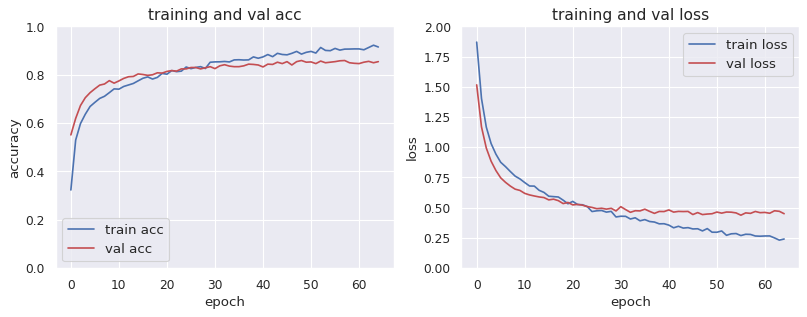

In [176]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [177]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.43720686
0.8587963


## 5. データ作成、モデル生成・学習9(mixup, resizedcropを除く）  
val_loss = 0.43024173  
val_acc = 0.87384254 

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [178]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [179]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [180]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [181]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [182]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [183]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [184]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [185]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [186]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [187]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [188]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_9-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # # ↓ここを追加
        # data,target_a,target_b,lam = mixup_data(data, label, alpha=0.2, use_cuda=torch.cuda.is_available())
        # data = data.to(device)
        # label = target_a.to(device) # target_aへ書換え
        # #　ここまで追加

        output = model(data)
        loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.6492 - acc:0.4276 ---- val_loss:1.3419 - val_acc:0.5683



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.1223 - acc:0.6438 ---- val_loss:0.9884 - val_acc:0.6817



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:0.8840 - acc:0.7016 ---- val_loss:0.8259 - val_acc:0.7303



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.7563 - acc:0.7484 ---- val_loss:0.7368 - val_acc:0.7454



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.6591 - acc:0.7714 ---- val_loss:0.6493 - val_acc:0.7685



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.5957 - acc:0.7950 ---- val_loss:0.6032 - val_acc:0.7882



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.5563 - acc:0.8036 ---- val_loss:0.5915 - val_acc:0.7940



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.5108 - acc:0.8216 ---- val_loss:0.5760 - val_acc:0.7998



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.4742 - acc:0.8266 ---- val_loss:0.5529 - val_acc:0.8090



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.4340 - acc:0.8490 ---- val_loss:0.5111 - val_acc:0.8252



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.3944 - acc:0.8693 ---- val_loss:0.5040 - val_acc:0.8229



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.3689 - acc:0.8744 ---- val_loss:0.5003 - val_acc:0.8194



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.3391 - acc:0.8903 ---- val_loss:0.4843 - val_acc:0.8310



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.3120 - acc:0.8979 ---- val_loss:0.4952 - val_acc:0.8322

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.2976 - acc:0.8994 ---- val_loss:0.4709 - val_acc:0.8299



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.2726 - acc:0.9148 ---- val_loss:0.4636 - val_acc:0.8356



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.2471 - acc:0.9236 ---- val_loss:0.4527 - val_acc:0.8414



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.2224 - acc:0.9328 ---- val_loss:0.4736 - val_acc:0.8461

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.2067 - acc:0.9398 ---- val_loss:0.4491 - val_acc:0.8588



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.2051 - acc:0.9351 ---- val_loss:0.4533 - val_acc:0.8542

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.1970 - acc:0.9419 ---- val_loss:0.4591 - val_acc:0.8438

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.1681 - acc:0.9540 ---- val_loss:0.4435 - val_acc:0.8600



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.1566 - acc:0.9572 ---- val_loss:0.4480 - val_acc:0.8588

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.1495 - acc:0.9567 ---- val_loss:0.4569 - val_acc:0.8519

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.1345 - acc:0.9625 ---- val_loss:0.4407 - val_acc:0.8553



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.1296 - acc:0.9620 ---- val_loss:0.4404 - val_acc:0.8565



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.1182 - acc:0.9685 ---- val_loss:0.4433 - val_acc:0.8542

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.1205 - acc:0.9658 ---- val_loss:0.4380 - val_acc:0.8600



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.1125 - acc:0.9705 ---- val_loss:0.4543 - val_acc:0.8519

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.1043 - acc:0.9717 ---- val_loss:0.4519 - val_acc:0.8692

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.1061 - acc:0.9705 ---- val_loss:0.4523 - val_acc:0.8530

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.0906 - acc:0.9767 ---- val_loss:0.4518 - val_acc:0.8576

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.0855 - acc:0.9785 ---- val_loss:0.4418 - val_acc:0.8657

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.0881 - acc:0.9737 ---- val_loss:0.4302 - val_acc:0.8715



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.0766 - acc:0.9788 ---- val_loss:0.4725 - val_acc:0.8646

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.0745 - acc:0.9808 ---- val_loss:0.4773 - val_acc:0.8553

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.0792 - acc:0.9782 ---- val_loss:0.4892 - val_acc:0.8600

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.0717 - acc:0.9811 ---- val_loss:0.4654 - val_acc:0.8634

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.0728 - acc:0.9820 ---- val_loss:0.4474 - val_acc:0.8738

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.0672 - acc:0.9832 ---- val_loss:0.4786 - val_acc:0.8611

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.0708 - acc:0.9788 ---- val_loss:0.4776 - val_acc:0.8588

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.0699 - acc:0.9811 ---- val_loss:0.4406 - val_acc:0.8657

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.0582 - acc:0.9853 ---- val_loss:0.4416 - val_acc:0.8692

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.0652 - acc:0.9823 ---- val_loss:0.4472 - val_acc:0.8657

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

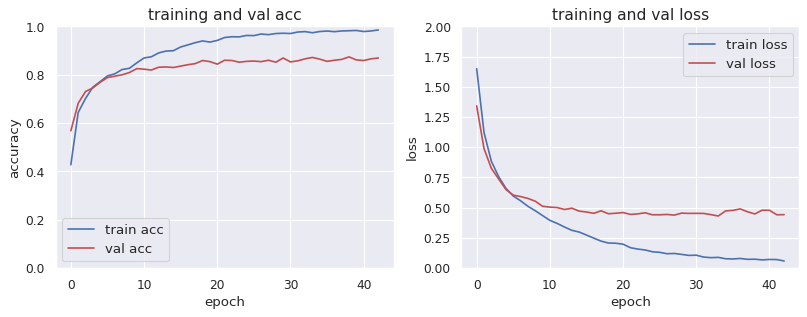

In [189]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [190]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.43024173
0.87384254


## 5. データ作成、モデル生成・学習10(resizedcrop以外）  
val_loss = 0.43394005  
val_acc = 0.87615734

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [191]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


In [192]:
#Mixupの実装
#https://qiita.com/karaage0703/items/9b56a68a5dba4ad330d9
def mixup_data(x, y, alpha=1.0, use_cuda=True):

    '''Compute the mixup data. Return mixed inputs, pairs of targets, and lambda'''
    if alpha > 0.:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.
    batch_size = x.size()[0]
    if use_cuda:
        index = torch.randperm(batch_size).cuda()
    else:
        index = torch.randperm(batch_size)

    mixed_x = lam * x + (1 - lam) * x[index,:]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

#カテゴリー変数をone-hotに変換し、mixupに適用
def mixup_criterion(y_a, y_b, lam):
    return lambda criterion, pred: lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [193]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [194]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [195]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [196]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [197]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [198]:
#画像データは重いため、バッチサイズで小分けして処理する
np.random.seed(seed)
torch.manual_seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

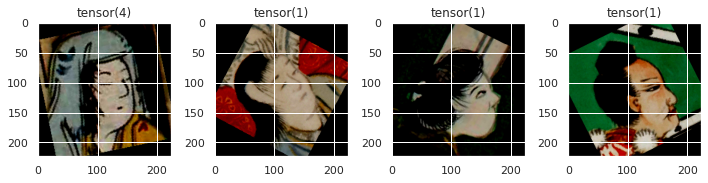

In [199]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = batch[0][i]
  image = image.numpy().transpose(1,2,0)
  label = batch[1][i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  plt.title(label)
plt.tight_layout()
plt.show()

In [200]:
#Mixupの適用
data,target_a,target_b,lam = mixup_data(batch[0], batch[1], alpha=0.4, use_cuda=torch.cuda.is_available())
data = data
label = target_a # target_aへ書換え

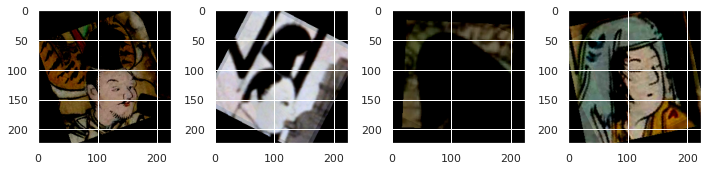

In [201]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = data[i]
  image = image.numpy().transpose(1,2,0)
  # label = label[i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  # plt.title(label)
plt.tight_layout()
plt.show()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [202]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [203]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [204]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [205]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [206]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_10-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
np.random.seed(seed) #mixupを実装する際はnp.randomもここで定義し直す
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # ↓mixup用にここを変更
        data,target_a,target_b,lam = mixup_data(data, label, alpha=0.4, use_cuda=torch.cuda.is_available())
        data = data.to(device)
        label = target_a.to(device) # target_aへ書換え
        # ここまで変更

        output = model(data)
        #mixup用のlossを実装
        loss_func = mixup_criterion(target_a, target_b, lam)
        loss = loss_func(criterion, output)
        # output = model(data)
        # loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.8398 - acc:0.3191 ---- val_loss:1.4271 - val_acc:0.5451



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.3488 - acc:0.4209 ---- val_loss:1.1072 - val_acc:0.6400



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.1827 - acc:0.4432 ---- val_loss:0.9510 - val_acc:0.7106



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:1.0668 - acc:0.4699 ---- val_loss:0.8409 - val_acc:0.7350



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:1.0012 - acc:0.5340 ---- val_loss:0.7615 - val_acc:0.7627



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:1.0056 - acc:0.4999 ---- val_loss:0.7344 - val_acc:0.7685



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.9248 - acc:0.5061 ---- val_loss:0.6911 - val_acc:0.7847



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.9239 - acc:0.5213 ---- val_loss:0.6717 - val_acc:0.7894



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.8751 - acc:0.5082 ---- val_loss:0.6457 - val_acc:0.7951



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.8550 - acc:0.5659 ---- val_loss:0.6315 - val_acc:0.8079



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.8205 - acc:0.5438 ---- val_loss:0.6051 - val_acc:0.8148



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.7638 - acc:0.5664 ---- val_loss:0.5856 - val_acc:0.8090



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.8183 - acc:0.5683 ---- val_loss:0.5808 - val_acc:0.8148



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.8025 - acc:0.5702 ---- val_loss:0.5646 - val_acc:0.8206



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.7780 - acc:0.5536 ---- val_loss:0.5695 - val_acc:0.8252

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.7432 - acc:0.5787 ---- val_loss:0.5372 - val_acc:0.8264



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.7637 - acc:0.6089 ---- val_loss:0.5465 - val_acc:0.8287

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.8040 - acc:0.5554 ---- val_loss:0.5353 - val_acc:0.8310



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.7478 - acc:0.5906 ---- val_loss:0.5196 - val_acc:0.8368



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.6799 - acc:0.5496 ---- val_loss:0.5200 - val_acc:0.8345

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.7146 - acc:0.6035 ---- val_loss:0.5044 - val_acc:0.8368



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.6881 - acc:0.5525 ---- val_loss:0.5083 - val_acc:0.8356

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.7035 - acc:0.5930 ---- val_loss:0.5010 - val_acc:0.8403



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.6418 - acc:0.5705 ---- val_loss:0.4858 - val_acc:0.8461



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.6433 - acc:0.5523 ---- val_loss:0.4891 - val_acc:0.8426

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.6447 - acc:0.5944 ---- val_loss:0.4800 - val_acc:0.8426



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.6324 - acc:0.6019 ---- val_loss:0.4889 - val_acc:0.8449

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.6534 - acc:0.6429 ---- val_loss:0.4886 - val_acc:0.8438

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.6352 - acc:0.5956 ---- val_loss:0.4816 - val_acc:0.8449

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.6523 - acc:0.5688 ---- val_loss:0.4880 - val_acc:0.8495

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.6622 - acc:0.5605 ---- val_loss:0.4717 - val_acc:0.8530



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.5770 - acc:0.5901 ---- val_loss:0.4802 - val_acc:0.8449

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.6198 - acc:0.6604 ---- val_loss:0.4739 - val_acc:0.8530

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.6246 - acc:0.5872 ---- val_loss:0.4785 - val_acc:0.8472

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.6054 - acc:0.5746 ---- val_loss:0.4767 - val_acc:0.8542

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.6119 - acc:0.6219 ---- val_loss:0.4708 - val_acc:0.8484



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.6572 - acc:0.5662 ---- val_loss:0.4900 - val_acc:0.8495

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.6150 - acc:0.5983 ---- val_loss:0.4723 - val_acc:0.8623

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.6443 - acc:0.6183 ---- val_loss:0.4723 - val_acc:0.8634

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.5841 - acc:0.5741 ---- val_loss:0.4657 - val_acc:0.8634



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.5816 - acc:0.6471 ---- val_loss:0.4826 - val_acc:0.8565

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.6271 - acc:0.6587 ---- val_loss:0.4516 - val_acc:0.8576



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.6843 - acc:0.6048 ---- val_loss:0.4848 - val_acc:0.8623

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.5424 - acc:0.6444 ---- val_loss:0.4592 - val_acc:0.8623

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:45 - loss:0.5496 - acc:0.5984 ---- val_loss:0.4721 - val_acc:0.8495

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:46 - loss:0.5286 - acc:0.6142 ---- val_loss:0.4874 - val_acc:0.8519

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:47 - loss:0.5787 - acc:0.6198 ---- val_loss:0.4757 - val_acc:0.8576

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:48 - loss:0.5522 - acc:0.5772 ---- val_loss:0.4526 - val_acc:0.8600

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:49 - loss:0.5567 - acc:0.6147 ---- val_loss:0.4595 - val_acc:0.8565

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:50 - loss:0.5468 - acc:0.6236 ---- val_loss:0.4490 - val_acc:0.8657



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:51 - loss:0.5874 - acc:0.6284 ---- val_loss:0.4629 - val_acc:0.8565

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:52 - loss:0.6343 - acc:0.6328 ---- val_loss:0.4671 - val_acc:0.8519

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:53 - loss:0.5214 - acc:0.6092 ---- val_loss:0.4339 - val_acc:0.8715



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:54 - loss:0.5532 - acc:0.5843 ---- val_loss:0.4476 - val_acc:0.8646

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:55 - loss:0.5945 - acc:0.5407 ---- val_loss:0.4819 - val_acc:0.8600

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:56 - loss:0.5402 - acc:0.6775 ---- val_loss:0.4494 - val_acc:0.8623

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:57 - loss:0.5445 - acc:0.6556 ---- val_loss:0.4610 - val_acc:0.8588

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:58 - loss:0.5420 - acc:0.5785 ---- val_loss:0.4459 - val_acc:0.8646

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:59 - loss:0.5806 - acc:0.6088 ---- val_loss:0.4391 - val_acc:0.8657

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:60 - loss:0.5823 - acc:0.6118 ---- val_loss:0.4427 - val_acc:0.8762

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:61 - loss:0.5449 - acc:0.5703 ---- val_loss:0.4608 - val_acc:0.8565

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:62 - loss:0.5072 - acc:0.6156 ---- val_loss:0.4479 - val_acc:0.8623

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:63 - loss:0.5382 - acc:0.6581 ---- val_loss:0.4424 - val_acc:0.8634

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

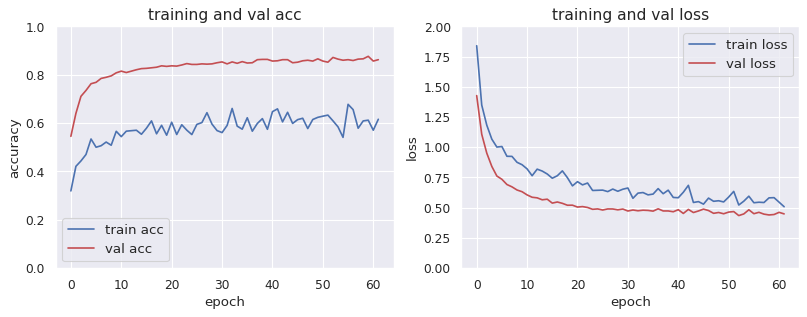

In [207]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)

plt.show()

In [208]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.43394005
0.87615734


## 5. データ作成、モデル生成・学習11(horizontalflip, mixup）  
val_loss = 0.44261083  
val_acc = 0.8657407 

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [209]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        # transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        # transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


In [210]:
#Mixupの実装
#https://qiita.com/karaage0703/items/9b56a68a5dba4ad330d9
def mixup_data(x, y, alpha=1.0, use_cuda=True):

    '''Compute the mixup data. Return mixed inputs, pairs of targets, and lambda'''
    if alpha > 0.:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.
    batch_size = x.size()[0]
    if use_cuda:
        index = torch.randperm(batch_size).cuda()
    else:
        index = torch.randperm(batch_size)

    mixed_x = lam * x + (1 - lam) * x[index,:]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

#カテゴリー変数をone-hotに変換し、mixupに適用
def mixup_criterion(y_a, y_b, lam):
    return lambda criterion, pred: lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [211]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [212]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [213]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [214]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [215]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [216]:
#画像データは重いため、バッチサイズで小分けして処理する
torch.manual_seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

In [217]:
#Mixupの適用
data,target_a,target_b,lam = mixup_data(batch[0], batch[1], alpha=0.4, use_cuda=torch.cuda.is_available())
data = data
label = target_a # target_aへ書換え

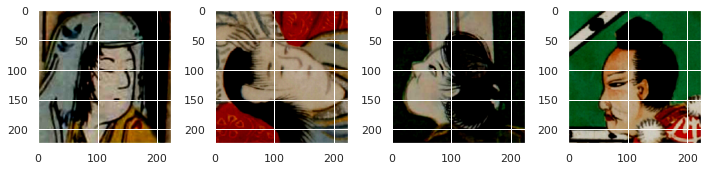

In [218]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = data[i]
  image = image.numpy().transpose(1,2,0)
  # label = label[i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  # plt.title(label)
plt.tight_layout()
plt.show()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [219]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [220]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [221]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [222]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [223]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_11-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
np.random.seed(seed) #mixupを実装する際はnp.randomもここで定義し直す
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # ↓mixup用にここを変更
        data,target_a,target_b,lam = mixup_data(data, label, alpha=0.4, use_cuda=torch.cuda.is_available())
        data = data.to(device)
        label = target_a.to(device) # target_aへ書換え
        # ここまで変更

        output = model(data)
        #mixup用のlossを実装
        loss_func = mixup_criterion(target_a, target_b, lam)
        loss = loss_func(criterion, output)
        # output = model(data)
        # loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.7664 - acc:0.3270 ---- val_loss:1.3157 - val_acc:0.6007



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.2686 - acc:0.4456 ---- val_loss:0.9705 - val_acc:0.6829



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.0878 - acc:0.4588 ---- val_loss:0.8204 - val_acc:0.7419



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:0.9748 - acc:0.4695 ---- val_loss:0.7381 - val_acc:0.7581



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:0.8983 - acc:0.5425 ---- val_loss:0.6891 - val_acc:0.7697



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:0.8938 - acc:0.5333 ---- val_loss:0.6576 - val_acc:0.7870



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:0.8163 - acc:0.5188 ---- val_loss:0.6239 - val_acc:0.7859



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:0.8271 - acc:0.5514 ---- val_loss:0.6151 - val_acc:0.7917



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:0.7676 - acc:0.5282 ---- val_loss:0.6035 - val_acc:0.7928



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:0.7701 - acc:0.5989 ---- val_loss:0.5801 - val_acc:0.8102



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.7062 - acc:0.5596 ---- val_loss:0.5656 - val_acc:0.8125



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.6668 - acc:0.5991 ---- val_loss:0.5556 - val_acc:0.8194



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.7225 - acc:0.5893 ---- val_loss:0.5475 - val_acc:0.8299



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.6759 - acc:0.5874 ---- val_loss:0.5399 - val_acc:0.8310



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.6863 - acc:0.5749 ---- val_loss:0.5423 - val_acc:0.8310

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.6294 - acc:0.6114 ---- val_loss:0.5204 - val_acc:0.8333



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.6549 - acc:0.6390 ---- val_loss:0.5139 - val_acc:0.8414



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.7006 - acc:0.5719 ---- val_loss:0.5130 - val_acc:0.8345



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.6259 - acc:0.6136 ---- val_loss:0.5044 - val_acc:0.8368



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.5576 - acc:0.5791 ---- val_loss:0.4901 - val_acc:0.8391



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.5959 - acc:0.6218 ---- val_loss:0.5004 - val_acc:0.8380

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.5876 - acc:0.5764 ---- val_loss:0.5021 - val_acc:0.8403

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.5961 - acc:0.6201 ---- val_loss:0.4941 - val_acc:0.8437

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.5205 - acc:0.6000 ---- val_loss:0.4760 - val_acc:0.8438



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.5350 - acc:0.5800 ---- val_loss:0.4848 - val_acc:0.8414

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.5524 - acc:0.6198 ---- val_loss:0.4722 - val_acc:0.8449



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.5388 - acc:0.6190 ---- val_loss:0.4851 - val_acc:0.8553

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.5662 - acc:0.6712 ---- val_loss:0.4841 - val_acc:0.8472

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.5346 - acc:0.6141 ---- val_loss:0.4739 - val_acc:0.8542

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.5589 - acc:0.5920 ---- val_loss:0.4877 - val_acc:0.8553

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.5759 - acc:0.5705 ---- val_loss:0.4727 - val_acc:0.8576

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.4846 - acc:0.6016 ---- val_loss:0.4770 - val_acc:0.8507

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.5360 - acc:0.6841 ---- val_loss:0.4804 - val_acc:0.8495

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.5380 - acc:0.6014 ---- val_loss:0.4727 - val_acc:0.8600

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.5221 - acc:0.6008 ---- val_loss:0.4678 - val_acc:0.8553



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.5449 - acc:0.6127 ---- val_loss:0.4770 - val_acc:0.8484

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.6047 - acc:0.5627 ---- val_loss:0.4856 - val_acc:0.8519

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.5227 - acc:0.6082 ---- val_loss:0.4754 - val_acc:0.8542

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.5653 - acc:0.6334 ---- val_loss:0.4729 - val_acc:0.8611

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.5098 - acc:0.5906 ---- val_loss:0.4675 - val_acc:0.8542



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.5151 - acc:0.6607 ---- val_loss:0.4710 - val_acc:0.8530

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.5470 - acc:0.6788 ---- val_loss:0.4757 - val_acc:0.8461

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.6166 - acc:0.6189 ---- val_loss:0.4845 - val_acc:0.8484

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.4956 - acc:0.6565 ---- val_loss:0.4680 - val_acc:0.8461

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:45 - loss:0.4876 - acc:0.6073 ---- val_loss:0.4686 - val_acc:0.8530

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:46 - loss:0.4747 - acc:0.6318 ---- val_loss:0.4680 - val_acc:0.8576

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:47 - loss:0.5173 - acc:0.6228 ---- val_loss:0.4769 - val_acc:0.8611

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:48 - loss:0.4874 - acc:0.5976 ---- val_loss:0.4694 - val_acc:0.8565

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:49 - loss:0.5045 - acc:0.6203 ---- val_loss:0.4858 - val_acc:0.8519

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:50 - loss:0.4932 - acc:0.6233 ---- val_loss:0.4658 - val_acc:0.8507



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:51 - loss:0.5290 - acc:0.6346 ---- val_loss:0.4699 - val_acc:0.8507

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:52 - loss:0.5759 - acc:0.6325 ---- val_loss:0.4791 - val_acc:0.8611

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:53 - loss:0.4609 - acc:0.6289 ---- val_loss:0.4696 - val_acc:0.8588

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:54 - loss:0.5110 - acc:0.5861 ---- val_loss:0.4788 - val_acc:0.8634

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:55 - loss:0.5359 - acc:0.5581 ---- val_loss:0.4831 - val_acc:0.8623

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:56 - loss:0.4820 - acc:0.6904 ---- val_loss:0.4642 - val_acc:0.8634



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:57 - loss:0.5092 - acc:0.6508 ---- val_loss:0.4697 - val_acc:0.8530

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:58 - loss:0.4806 - acc:0.5914 ---- val_loss:0.4572 - val_acc:0.8553



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:59 - loss:0.5413 - acc:0.6179 ---- val_loss:0.4689 - val_acc:0.8634

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:60 - loss:0.5290 - acc:0.6071 ---- val_loss:0.4736 - val_acc:0.8542

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:61 - loss:0.4856 - acc:0.5841 ---- val_loss:0.4861 - val_acc:0.8495

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:62 - loss:0.4722 - acc:0.6238 ---- val_loss:0.4575 - val_acc:0.8530

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:63 - loss:0.5004 - acc:0.6489 ---- val_loss:0.4555 - val_acc:0.8623



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:64 - loss:0.4614 - acc:0.6176 ---- val_loss:0.4534 - val_acc:0.8530



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:65 - loss:0.4947 - acc:0.6831 ---- val_loss:0.4660 - val_acc:0.8495

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:66 - loss:0.4851 - acc:0.5522 ---- val_loss:0.4658 - val_acc:0.8553

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:67 - loss:0.5190 - acc:0.5940 ---- val_loss:0.4685 - val_acc:0.8565

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:68 - loss:0.5571 - acc:0.6445 ---- val_loss:0.4619 - val_acc:0.8611

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:69 - loss:0.4771 - acc:0.6439 ---- val_loss:0.4613 - val_acc:0.8519

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:70 - loss:0.5458 - acc:0.5705 ---- val_loss:0.4630 - val_acc:0.8542

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:71 - loss:0.5170 - acc:0.6081 ---- val_loss:0.4535 - val_acc:0.8588

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:72 - loss:0.5302 - acc:0.5779 ---- val_loss:0.4790 - val_acc:0.8484

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:73 - loss:0.4884 - acc:0.5886 ---- val_loss:0.4787 - val_acc:0.8565

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:74 - loss:0.4542 - acc:0.5667 ---- val_loss:0.4426 - val_acc:0.8646



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:75 - loss:0.5526 - acc:0.5687 ---- val_loss:0.4548 - val_acc:0.8588

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:76 - loss:0.4316 - acc:0.5864 ---- val_loss:0.4621 - val_acc:0.8542

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:77 - loss:0.4570 - acc:0.6268 ---- val_loss:0.4622 - val_acc:0.8623

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:78 - loss:0.5386 - acc:0.6200 ---- val_loss:0.4682 - val_acc:0.8542

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:79 - loss:0.5336 - acc:0.6401 ---- val_loss:0.4744 - val_acc:0.8600

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:80 - loss:0.4367 - acc:0.6430 ---- val_loss:0.4453 - val_acc:0.8634

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:81 - loss:0.5151 - acc:0.6810 ---- val_loss:0.4536 - val_acc:0.8588

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:82 - loss:0.4608 - acc:0.6228 ---- val_loss:0.4579 - val_acc:0.8600

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:83 - loss:0.5297 - acc:0.6313 ---- val_loss:0.4709 - val_acc:0.8611

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:84 - loss:0.4882 - acc:0.6955 ---- val_loss:0.4609 - val_acc:0.8657

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

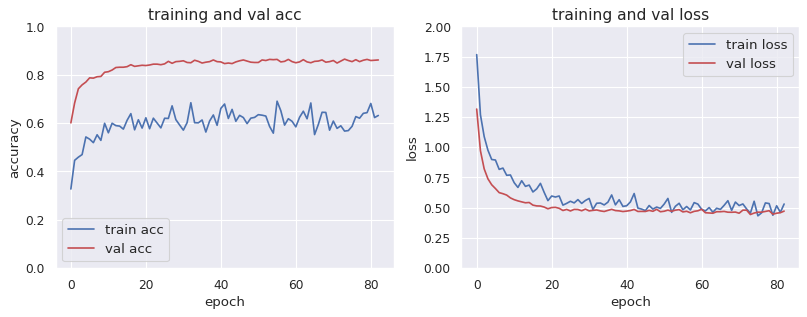

In [224]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [225]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.44261083
0.8657407


## 5. データ作成、モデル生成・学習12(resizedcrop, mixup）  
val_loss = 0.49432865  
val_acc = 0.86342585

### 5.1. 画像に前処理する内容(transform)をtrain, val用に定義する

In [226]:
#randomerasing追加
train_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        # transforms.RandomAffine([0,30], scale=(0.8, 1.0)), #-30°~30°でランダムに回転、画像を0.8~1.0倍率に変換
        transforms.RandomResizedCrop(224), #ランダムに切り抜いた後にリサイズを行う。
        # transforms.RandomHorizontalFlip(p=0.5), #50%の確率で反転
        transforms.ToTensor(), #PIL Image オブジェクトをテンソルに変換し、値の範囲を [0, 255] から [0, 1] にスケールする
        # transforms.RandomErasing(p=0.2, scale=(0.02, 0.33), ratio=(0.3, 3.3)), # ⇦⇦⇦⇦ここを追加！！
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])  #swin_transformerはGeLUを使っているため-1~1に変換する
    ]
)

val_transforms = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5, 0.5, 0.5])
    ]
)


In [227]:
#Mixupの実装
#https://qiita.com/karaage0703/items/9b56a68a5dba4ad330d9
def mixup_data(x, y, alpha=1.0, use_cuda=True):

    '''Compute the mixup data. Return mixed inputs, pairs of targets, and lambda'''
    if alpha > 0.:
        lam = np.random.beta(alpha, alpha)
    else:
        lam = 1.
    batch_size = x.size()[0]
    if use_cuda:
        index = torch.randperm(batch_size).cuda()
    else:
        index = torch.randperm(batch_size)

    mixed_x = lam * x + (1 - lam) * x[index,:]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

#カテゴリー変数をone-hotに変換し、mixupに適用
def mixup_criterion(y_a, y_b, lam):
    return lambda criterion, pred: lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

### 5.2. datasetの作成  
以下のどちらかを実行（１つ目推奨）  

#### 5.2.1. datasetをtrain, val用に分割（train, valそれぞれ別のtransformを適用する）  
今回のデータは検証用のデータがないため、trainデータから一部を検証用のデータにする  
少し工夫が必要

In [228]:
train_dataset_dir = Path('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train')

In [229]:
#trainディレクトリ全体の画像データセットを作成する
full_dataset = datasets.ImageFolder(train_dataset_dir)
#torch.utils.data.random_splitはデータセットをランダムに分割することはできるが、層化分割（ラベルを考慮して分割）ができない
#scikit-learnのtrain_test_split()を組み合わせて層化分割を行う
#※分割するときは、ラベル内のデータが2つ以上ないとだめ！今回はgender_status5が1枚しかないため、同じ画像をコピーして2枚にする。　⇨ trainの画像数は4238から4239に変更。
train_indices, val_indices = train_test_split(list(range(len(full_dataset.targets))), test_size=0.2, stratify=full_dataset.targets, random_state=seed)

In [230]:
#学習用のディレクトリしかなく、その中から検証用を分割する際、
#datasets.ImageFolderでtransformを適用した後分割すると、学習用と検証用のtransformsが同じになってしまう（検証用は反転とかしない）。
#学習用と検証用で別のtransformを適用する場合は、コンストラクタ引数にtransformを追加したsubsetを自作する。
class MySubset(Dataset):
    def __init__(self, dataset, indices, transform=None):
        self.dataset = dataset
        self.indices = indices
        self.transform = transform

    def __getitem__(self, idx):
        img, label = self.dataset[self.indices[idx]]
        if self.transform:
            img = self.transform(img)

        return img, label

    def __len__(self):
        return len(self.indices)

train_dataset = MySubset(full_dataset, train_indices, train_transforms)
val_dataset = MySubset(full_dataset, val_indices, val_transforms)


In [231]:
#分割できてるか確認
print(len(train_dataset))
print(len(val_dataset))

3391
848


### 5.3. dataloaderの作成

In [232]:
# train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=128, shuffle=True)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [233]:
#画像データは重いため、バッチサイズで小分けして処理する
torch.manual_seed(seed)
np.random.seed(seed)
batch = next(iter(train_loader))
len(batch) #出力されるデータは２つ。１つ目が画像で２つ目が画像のラベル

2

In [234]:
#Mixupの適用
data,target_a,target_b,lam = mixup_data(batch[0], batch[1], alpha=0.4, use_cuda=torch.cuda.is_available())
data = data
label = target_a # target_aへ書換え

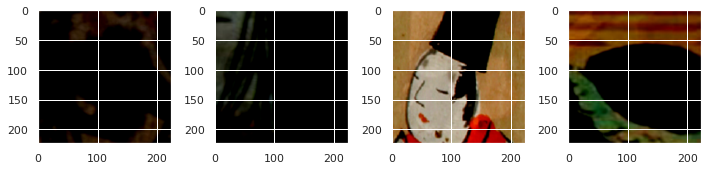

In [235]:
#試しに画像を描画する
plt.figure(figsize = (10, 10))
for i in range(4):
  image = data[i]
  image = image.numpy().transpose(1,2,0)
  # label = label[i]
  plt.subplot(1,4,i+1)
  plt.imshow(image)
  # plt.title(label)
plt.tight_layout()
plt.show()

### 6. timmのresnet18dで画像分類
https://htomblog.com/pthon-timm  
pytorchとtimmを用いて画像分類を行う。  

In [236]:
# pprint(timm.list_models(pretrained = True)) #一覧を縦に表示。pretrainedが設定されているものを表示
# print(len(timm.list_models(pretrained = True))) #現時点で７１５

### 6.1. 学習設定、モデル作成

In [237]:
# 学習設定
epochs = 100
lr = 3e-5
gamma = 0.7

In [238]:
#timmのアルゴリズムを設定
model = timm.create_model('resnet18d', pretrained=True, num_classes=8) #pretrained：事前学習をするか。 num_classes：ラベル数。今回は8クラス。
model.to('cuda:0')

ResNet(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (act1): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop_block): Identity()
   

### 6.2. モデル学習

In [239]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = StepLR(optimizer, step_size=1, gamma=gamma) #学習が進むにつれて学習率を下げていく。Optimizerはミニバッチごとに学習率を変化させる。 これをepochごとにも調整したい場合にschdulerを使用する。

In [240]:
#学習ループの設定、実行
train_acc_list = []
val_acc_list = []
train_loss_list = []
val_loss_list = []

#EarlyStoppingクラスの呼び出し
early_stopping = EarlyStopping(patience=10, #何回更新できなければ終了するか
                                path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_12-0.pth') #１番よかった重み等を保存するpathを指定
# dataloaderから取り出す際にseedを固定する(学習時のエポックのfor文が始まる前に以下を実行する)
np.random.seed(seed) #mixupを実装する際はnp.randomもここで定義し直す
torch.manual_seed(seed)

for epoch in range(epochs):
    epoch_loss = 0
    epoch_accuracy = 0

    model.train()

    for data, label in tqdm(train_loader):
        data = data.to(device) #GPU使用
        label = label.to(device) #GPU使用
        # ↓mixup用にここを変更
        data,target_a,target_b,lam = mixup_data(data, label, alpha=0.4, use_cuda=torch.cuda.is_available())
        data = data.to(device)
        label = target_a.to(device) # target_aへ書換え
        # ここまで変更

        output = model(data)
        #mixup用のlossを実装
        loss_func = mixup_criterion(target_a, target_b, lam)
        loss = loss_func(criterion, output)
        # output = model(data)
        # loss = criterion(output, label)

        optimizer.zero_grad() #前に計算した勾配を初期化。逆伝播で勾配を計算した際、前に計算した勾配がある場合はそれに加算する。RNN等のモデルでは有用だがそうでない場合は、前に計算した勾配を0に初期化する必要がある。
        loss.backward() #逆伝播。backwardの後に呼び出す
        optimizer.step() #ステップを進める。これをやらないと学習が進まない。

        acc = (output.argmax(dim=1) == label).float().mean()
        epoch_accuracy += acc / len(train_loader)
        epoch_loss += loss / len(train_loader)

    model.eval()

    with torch.no_grad():
        epoch_val_accuracy = 0
        epoch_val_loss = 0

        for data, label in val_loader:
            data = data.to(device)
            label = label.to(device)

            val_output = model(data)
            val_loss = criterion(val_output, label)

            acc = (val_output.argmax(dim=1) == label).float().mean()
            epoch_val_accuracy += acc / len(val_loader)
            epoch_val_loss += val_loss / len(val_loader)

    print(
        f'Epoch:{epoch+1} - loss:{epoch_loss:.4f} - acc:{epoch_accuracy:.4f} ---- val_loss:{epoch_val_loss:.4f} - val_acc:{epoch_val_accuracy:.4f}\n'
    )
    train_acc_list.append(epoch_accuracy)
    val_acc_list.append(epoch_val_accuracy)
    train_loss_list.append(epoch_loss)
    val_loss_list.append(epoch_val_loss)

    #EarlyStoppingの実装
    early_stopping(epoch_val_loss, model) # 最良モデルならモデルパラメータ保存
    if early_stopping.early_stop: 
        # 一定epochだけval_lossが最低値を更新しなかった場合、ここに入り学習を終了
        break

  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:1 - loss:1.8875 - acc:0.2851 ---- val_loss:1.4704 - val_acc:0.4850



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:2 - loss:1.4770 - acc:0.3990 ---- val_loss:1.1248 - val_acc:0.6470



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:3 - loss:1.2853 - acc:0.4228 ---- val_loss:0.9761 - val_acc:0.6817



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:4 - loss:1.1764 - acc:0.4400 ---- val_loss:0.8882 - val_acc:0.6991



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:5 - loss:1.1223 - acc:0.4762 ---- val_loss:0.8215 - val_acc:0.7188



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:6 - loss:1.1132 - acc:0.4711 ---- val_loss:0.8027 - val_acc:0.7292



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:7 - loss:1.0565 - acc:0.4831 ---- val_loss:0.7645 - val_acc:0.7407



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:8 - loss:1.0655 - acc:0.4928 ---- val_loss:0.7423 - val_acc:0.7639



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:9 - loss:1.0316 - acc:0.4680 ---- val_loss:0.7271 - val_acc:0.7581



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:10 - loss:1.0089 - acc:0.5273 ---- val_loss:0.6948 - val_acc:0.7708



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:11 - loss:0.9626 - acc:0.5004 ---- val_loss:0.6874 - val_acc:0.7662



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:12 - loss:0.9234 - acc:0.5266 ---- val_loss:0.6718 - val_acc:0.7766



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:13 - loss:0.9654 - acc:0.5208 ---- val_loss:0.6505 - val_acc:0.7743



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:14 - loss:0.9438 - acc:0.5252 ---- val_loss:0.6492 - val_acc:0.7801



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:15 - loss:0.9303 - acc:0.5256 ---- val_loss:0.6389 - val_acc:0.7813



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:16 - loss:0.8949 - acc:0.5377 ---- val_loss:0.6230 - val_acc:0.7859



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:17 - loss:0.9317 - acc:0.5550 ---- val_loss:0.6070 - val_acc:0.7870



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:18 - loss:0.9563 - acc:0.5179 ---- val_loss:0.6164 - val_acc:0.7894

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:19 - loss:0.9023 - acc:0.5443 ---- val_loss:0.6102 - val_acc:0.7998

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:20 - loss:0.8406 - acc:0.5115 ---- val_loss:0.6099 - val_acc:0.7917

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:21 - loss:0.8718 - acc:0.5489 ---- val_loss:0.5931 - val_acc:0.7975



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:22 - loss:0.8514 - acc:0.5258 ---- val_loss:0.5822 - val_acc:0.7951



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:23 - loss:0.8614 - acc:0.5517 ---- val_loss:0.5758 - val_acc:0.8113



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:24 - loss:0.8159 - acc:0.5346 ---- val_loss:0.5596 - val_acc:0.8113



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:25 - loss:0.8072 - acc:0.5266 ---- val_loss:0.5621 - val_acc:0.8113

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:26 - loss:0.8290 - acc:0.5452 ---- val_loss:0.5545 - val_acc:0.7998



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:27 - loss:0.7944 - acc:0.5600 ---- val_loss:0.5612 - val_acc:0.8113

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:28 - loss:0.8150 - acc:0.5990 ---- val_loss:0.5580 - val_acc:0.8056

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:29 - loss:0.7728 - acc:0.5614 ---- val_loss:0.5555 - val_acc:0.8148

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:30 - loss:0.7986 - acc:0.5336 ---- val_loss:0.5557 - val_acc:0.8102

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:31 - loss:0.8167 - acc:0.5237 ---- val_loss:0.5454 - val_acc:0.8171



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:32 - loss:0.7425 - acc:0.5559 ---- val_loss:0.5331 - val_acc:0.8264



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:33 - loss:0.7871 - acc:0.6027 ---- val_loss:0.5331 - val_acc:0.8113

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:34 - loss:0.7782 - acc:0.5507 ---- val_loss:0.5340 - val_acc:0.8171

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:35 - loss:0.7611 - acc:0.5495 ---- val_loss:0.5504 - val_acc:0.8160

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:36 - loss:0.7762 - acc:0.5653 ---- val_loss:0.5299 - val_acc:0.8194



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:37 - loss:0.8242 - acc:0.5247 ---- val_loss:0.5412 - val_acc:0.8275

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:38 - loss:0.7665 - acc:0.5573 ---- val_loss:0.5393 - val_acc:0.8252

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:39 - loss:0.7918 - acc:0.5847 ---- val_loss:0.5282 - val_acc:0.8229



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:40 - loss:0.7458 - acc:0.5472 ---- val_loss:0.5222 - val_acc:0.8206



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:41 - loss:0.7338 - acc:0.5984 ---- val_loss:0.5277 - val_acc:0.8275

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:42 - loss:0.7837 - acc:0.6154 ---- val_loss:0.5147 - val_acc:0.8275



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:43 - loss:0.8294 - acc:0.5685 ---- val_loss:0.5447 - val_acc:0.8160

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:44 - loss:0.7051 - acc:0.6088 ---- val_loss:0.5165 - val_acc:0.8310

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:45 - loss:0.7114 - acc:0.5706 ---- val_loss:0.5119 - val_acc:0.8368



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:46 - loss:0.6843 - acc:0.5897 ---- val_loss:0.5158 - val_acc:0.8391

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:47 - loss:0.7485 - acc:0.5591 ---- val_loss:0.5225 - val_acc:0.8299

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:48 - loss:0.6956 - acc:0.5436 ---- val_loss:0.5120 - val_acc:0.8356

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:49 - loss:0.6963 - acc:0.5843 ---- val_loss:0.5147 - val_acc:0.8356

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:50 - loss:0.6990 - acc:0.5705 ---- val_loss:0.5064 - val_acc:0.8310



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:51 - loss:0.7355 - acc:0.6007 ---- val_loss:0.5136 - val_acc:0.8368

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:52 - loss:0.7778 - acc:0.5850 ---- val_loss:0.5196 - val_acc:0.8438

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:53 - loss:0.6503 - acc:0.5900 ---- val_loss:0.5076 - val_acc:0.8495

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:54 - loss:0.6960 - acc:0.5463 ---- val_loss:0.5153 - val_acc:0.8461

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:55 - loss:0.7311 - acc:0.5318 ---- val_loss:0.5358 - val_acc:0.8356

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:56 - loss:0.6877 - acc:0.6450 ---- val_loss:0.5138 - val_acc:0.8403

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:57 - loss:0.6999 - acc:0.6134 ---- val_loss:0.5221 - val_acc:0.8333

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:58 - loss:0.6776 - acc:0.5543 ---- val_loss:0.4957 - val_acc:0.8345



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:59 - loss:0.7099 - acc:0.5819 ---- val_loss:0.5099 - val_acc:0.8484

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:60 - loss:0.7213 - acc:0.5774 ---- val_loss:0.5221 - val_acc:0.8403

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:61 - loss:0.6775 - acc:0.5475 ---- val_loss:0.5090 - val_acc:0.8403

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:62 - loss:0.6504 - acc:0.5757 ---- val_loss:0.5055 - val_acc:0.8403

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:63 - loss:0.6793 - acc:0.6262 ---- val_loss:0.4943 - val_acc:0.8414



  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:64 - loss:0.6399 - acc:0.5805 ---- val_loss:0.5050 - val_acc:0.8380

EarlyStopping counter: 1 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:65 - loss:0.6823 - acc:0.6329 ---- val_loss:0.5170 - val_acc:0.8380

EarlyStopping counter: 2 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:66 - loss:0.6724 - acc:0.5231 ---- val_loss:0.5012 - val_acc:0.8484

EarlyStopping counter: 3 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:67 - loss:0.7043 - acc:0.5616 ---- val_loss:0.5090 - val_acc:0.8438

EarlyStopping counter: 4 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:68 - loss:0.7185 - acc:0.6068 ---- val_loss:0.5118 - val_acc:0.8472

EarlyStopping counter: 5 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:69 - loss:0.6596 - acc:0.6102 ---- val_loss:0.5037 - val_acc:0.8438

EarlyStopping counter: 6 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:70 - loss:0.7295 - acc:0.5418 ---- val_loss:0.5000 - val_acc:0.8634

EarlyStopping counter: 7 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:71 - loss:0.6871 - acc:0.5718 ---- val_loss:0.5239 - val_acc:0.8507

EarlyStopping counter: 8 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:72 - loss:0.7042 - acc:0.5525 ---- val_loss:0.5166 - val_acc:0.8495

EarlyStopping counter: 9 out of 10


  0%|          | 0/106 [00:00<?, ?it/s]

Epoch:73 - loss:0.6604 - acc:0.5694 ---- val_loss:0.5112 - val_acc:0.8507

EarlyStopping counter: 10 out of 10


### 6.3. 学習結果の可視化

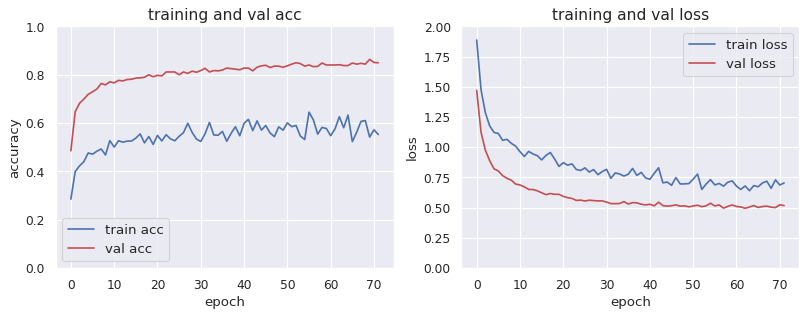

In [241]:
#出力したテンソルのデバイスをCPUに切り替える
device2 = torch.device('cpu')

train_acc = []
train_loss = []
val_acc = []
val_loss = []

for i in range(epoch):
    train_acc2 = train_acc_list[i].to(device2)
    train_acc3 = train_acc2.clone().numpy()
    train_acc.append(train_acc3)

    train_loss2 = train_loss_list[i].to(device2)
    train_loss3 = train_loss2.clone().detach().numpy()
    train_loss.append(train_loss3)
    
    val_acc2 = val_acc_list[i].to(device2)
    val_acc3 = val_acc2.clone().numpy()
    val_acc.append(val_acc3)
    
    val_loss2 = val_loss_list[i].to(device2)
    val_loss3 = val_loss2.clone().numpy()
    val_loss.append(val_loss3)


#上記で取得したデータをグラフ化
sns.set()
num_epochs = epoch

fig = plt.subplots(figsize=(12, 4), dpi=80)

ax1 = plt.subplot(1,2,1)
ax1.plot(range(num_epochs), train_acc, c='b', label='train acc')
ax1.plot(range(num_epochs), val_acc, c='r', label='val acc')
ax1.set_xlabel('epoch', fontsize='12')
ax1.set_ylabel('accuracy', fontsize='12')
ax1.set_title('training and val acc', fontsize='14')
ax1.legend(fontsize='12')
plt.ylim(0.0, 1.0)

ax2 = plt.subplot(1,2,2)
ax2.plot(range(num_epochs), train_loss, c='b', label='train loss')
ax2.plot(range(num_epochs), val_loss, c='r', label='val loss')
ax2.set_xlabel('epoch', fontsize='12')
ax2.set_ylabel('loss', fontsize='12')
ax2.set_title('training and val loss', fontsize='14')
ax2.legend(fontsize='12')
plt.ylim(0.0, 2.0)
plt.show()

In [242]:
best_acc = max(val_acc_list).to(device2).numpy()
best_loss = min(val_loss_list).to(device2).numpy()
print(best_loss)
print(best_acc)

0.49432865
0.86342585


## 6. 予測

In [243]:
device2 = torch.device('cpu')

In [244]:
#ロード、保存したいモデルのpathをリスト化する
load_path_list = []
save_path_list = []  

for i in range(13):
    #ロード、保存するpathをリストに入れていく
    load_path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_{}-0.pth'.format(i)
    load_path_list.append(load_path)
    save_path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/Submission_resnet18d_{}-0.csv'.format(i)
    save_path_list.append(save_path)

for i in range(13):
    cptfile = load_path_list[i] #学習済み重みを保存しているpthファイルを指定
    cpt = torch.load(cptfile)
    stdict_m = cpt['model_state_dict']
    stdict_o = cpt['opt_state_dict']
    model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み
    optimizer.load_state_dict(stdict_o) #モデルに学習ずみoptimizerを読み込み

    #testディレクトリ全体の画像データセットを作成する
    test_dir = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/test'
    test_dataset = datasets.ImageFolder(test_dir, val_transforms)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False) 

    #GPU上で予測する
    model.eval() #modelをevalモードに変更する
    predicts = []
    with torch.no_grad():
        for batch in test_loader: #test_loaderから画像を取り出しmodelで予測する
            data = batch[0]
            data = data.to(device)
            predict = model(data)
            predicts.append(predict)

    #予測した結果をdataframeにまとめる
    predicts2 = torch.cat(predicts) #torch.catでnp.concatenateと同様、縦に結合する
    predicts2 = predicts2.to(device2) #GPU上で実行してたのをCPU上に変更する
    predicts2 = np.array(predicts2) #Tensorからnparrayに変更する
    df_test = pd.DataFrame(predicts2) #dataframeに変更する
    df_test['predict'] = df_test.idxmax(axis=1) #df_testに予測した結果（predict）を作成する

    #結果を提出用にまとめる
    predict = df_test['predict']
    #提出用のcsvを読み込む
    df_sub = pd.read_csv('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/sample_submission.csv')
    #gender_statusに今回の予測値を入れる
    df_sub['gender_status'] = predict
    #提出用データを保存
    df_sub.to_csv(save_path_list[i], index=False)

In [245]:
# ###単体のモデルで予測したいとき###

# # 学習済み重みを保存しているpthファイルを指定
# cptfile = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_vit_base_patch16_224_in21k/results/vit_base_patch16_224_in21k_aug5/vit_base_patch16_224_in21k_12-0.pth' 
# # 保存したいcsvファイルを指定
# save_path = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_vit_base_patch16_224_in21k/results/vit_base_patch16_224_in21k_aug5/Submission_ViT_12-0.csv'

# #timmを用いてViT（pre-trained model)を実装する
# model = timm.create_model('vit_base_patch16_224_in21k', pretrained=True, num_classes=8) #modelの指定
# model.to(device) #モデルをGPU上で動かす設定

# #学習済みの重みをロード
# cpt = torch.load(cptfile)
# stdict_m = cpt['model_state_dict']
# stdict_o = cpt['opt_state_dict']
# model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み
# optimizer.load_state_dict(stdict_o) #モデルに学習ずみoptimizerを読み込み

# #testディレクトリ全体の画像データセットを作成する
# test_dir = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/test'
# test_dataset = datasets.ImageFolder(test_dir, val_transforms)
# test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False) 

# #GPU上で予測する

# model.eval() #modelをevalモードに変更する
# predicts = []
# with torch.no_grad():
#     for batch in test_loader: #test_loaderから画像を取り出しmodelで予測する
#         data = batch[0]
#         data = data.to(device)
#         predict = model(data)
#         predicts.append(predict)

# #予測した結果をdataframeにまとめる
# predicts2 = torch.cat(predicts) #torch.catでnp.concatenateと同様、縦に結合する
# predicts2 = predicts2.to(device2) #GPU上で実行してたのをCPU上に変更する
# predicts2 = np.array(predicts2) #Tensorからnparrayに変更する
# df_test = pd.DataFrame(predicts2) #dataframeに変更する
# df_test['predict'] = df_test.idxmax(axis=1) #df_testに予測した結果（predict）を作成する

# #結果を提出用にまとめる
# predict = df_test['predict']
# #提出用のcsvを読み込む
# df_sub = pd.read_csv('/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/sample_submission.csv')
# #gender_statusに今回の予測値を入れる
# df_sub['gender_status'] = predict
# #提出用データを保存
# df_sub.to_csv(save_path, index=False)



## GradCAMによるモデルの可視化

### resnet18d_0-0.pth  
上記の学習済み重みをロードして可視化

In [246]:
#gradcam実装
#ViTモデルを呼び出し、学習済みの重みをモデルにロードする
#学習済み重みを保存しているpthファイルを指定
cptfile = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_0-0.pth'
model = timm.create_model('resnet18d', pretrained=True, num_classes=8)
cpt = torch.load(cptfile)
stdict_m = cpt['model_state_dict']
model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み

<All keys matched successfully>

In [247]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00002.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_01382.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00068.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00166.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00025.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00295.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00027.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

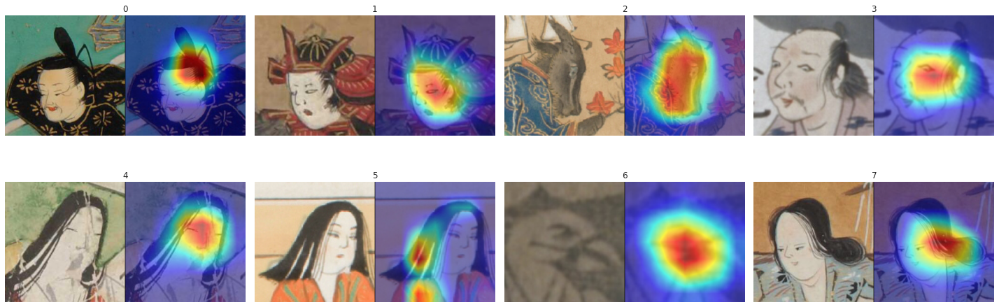

In [248]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

別の画像でもう一回！！

In [249]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00024.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_00500.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00105.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00089.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00100.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00423.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00870.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

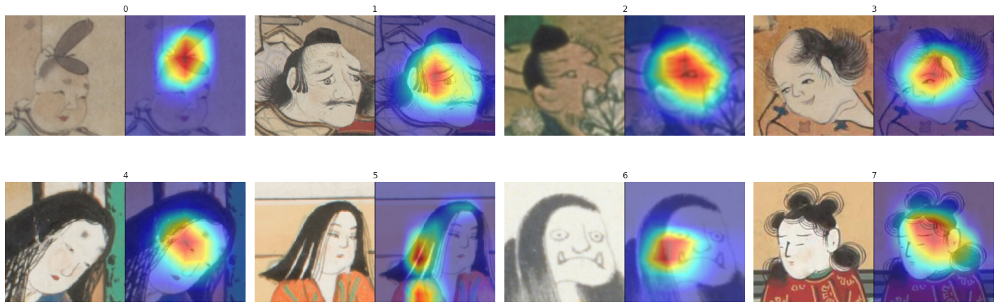

In [250]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

### resnet18d_2-0.pth  
上記の学習済み重みをロードして可視化

In [251]:
#gradcam実装
#ViTモデルを呼び出し、学習済みの重みをモデルにロードする
#学習済み重みを保存しているpthファイルを指定
cptfile = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_2-0.pth'
model = timm.create_model('resnet18d', pretrained=True, num_classes=8)
cpt = torch.load(cptfile)
stdict_m = cpt['model_state_dict']
model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み

<All keys matched successfully>

In [252]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00002.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_01382.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00068.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00166.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00025.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00295.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00027.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

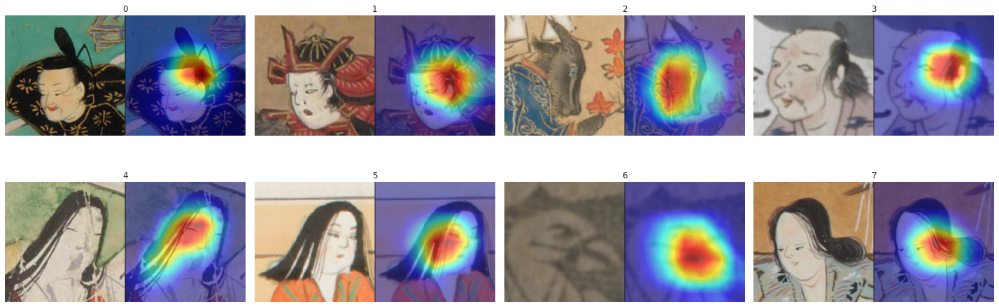

In [253]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

別の画像でもう一回！！

In [254]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00024.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_00500.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00105.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00089.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00100.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00423.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00870.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

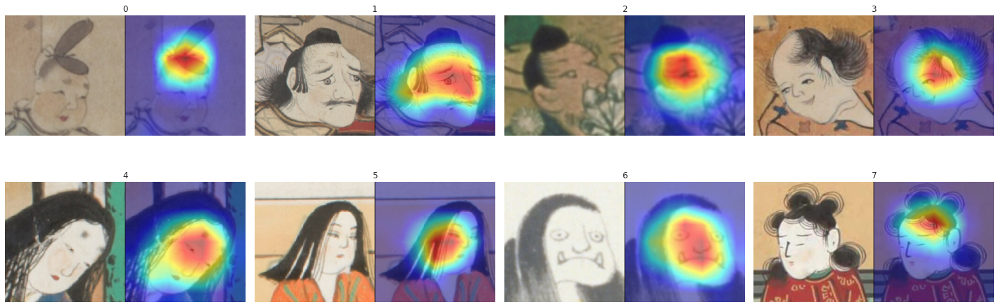

In [255]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

### resnet18d_6-0.pth  
上記の学習済み重みをロードして可視化

In [256]:
#gradcam実装
#ViTモデルを呼び出し、学習済みの重みをモデルにロードする
#学習済み重みを保存しているpthファイルを指定
cptfile = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_6-0.pth'
model = timm.create_model('resnet18d', pretrained=True, num_classes=8)
cpt = torch.load(cptfile)
stdict_m = cpt['model_state_dict']
model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み

<All keys matched successfully>

In [257]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00002.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_01382.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00068.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00166.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00025.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00295.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00027.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

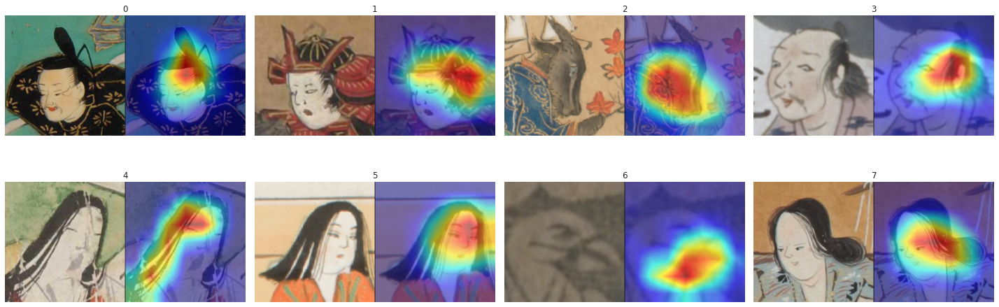

In [258]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

別の画像でもう一回！！

In [259]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00024.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_00500.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00105.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00089.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00100.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00423.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00870.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

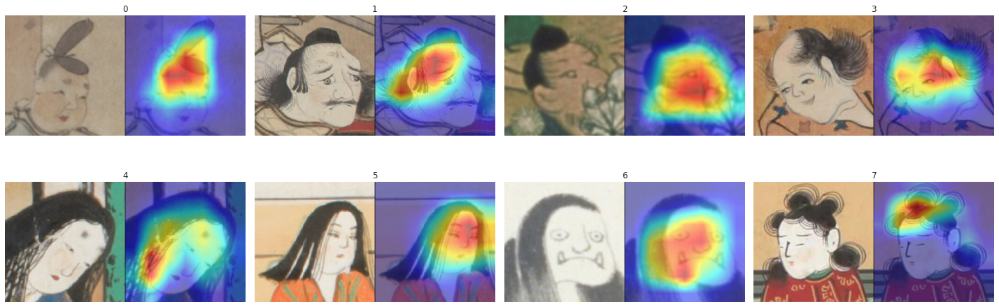

In [260]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

### resnet18d_8-0.pth  
上記の学習済み重みをロードして可視化

In [261]:
#gradcam実装
#ViTモデルを呼び出し、学習済みの重みをモデルにロードする
#学習済み重みを保存しているpthファイルを指定
cptfile = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_8-0.pth'
model = timm.create_model('resnet18d', pretrained=True, num_classes=8)
cpt = torch.load(cptfile)
stdict_m = cpt['model_state_dict']
model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み

<All keys matched successfully>

In [262]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00002.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_01382.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00068.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00166.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00025.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00295.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00027.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

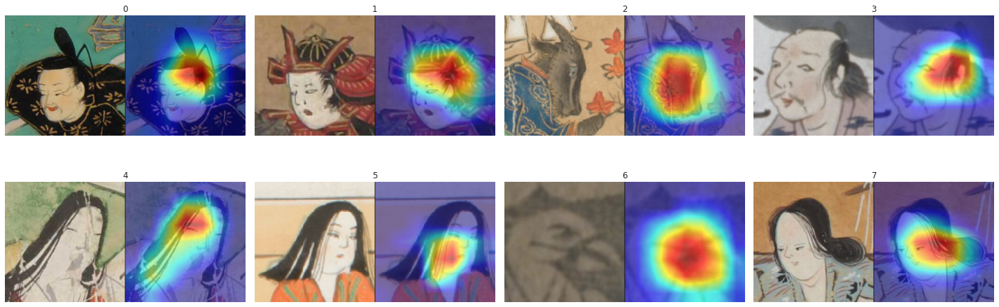

In [263]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

別の画像でもう一回！！

In [264]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00024.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_00500.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00105.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00089.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00100.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00423.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00870.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

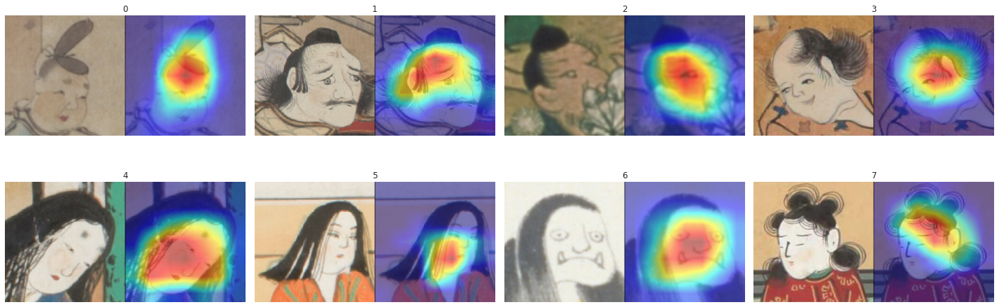

In [265]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

### resnet18d_9-0.pth  
上記の学習済み重みをロードして可視化

In [266]:
#gradcam実装
#ViTモデルを呼び出し、学習済みの重みをモデルにロードする
#学習済み重みを保存しているpthファイルを指定
cptfile = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_9-0.pth'
model = timm.create_model('resnet18d', pretrained=True, num_classes=8)
cpt = torch.load(cptfile)
stdict_m = cpt['model_state_dict']
model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み

<All keys matched successfully>

In [267]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00002.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_01382.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00068.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00166.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00025.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00295.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00027.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

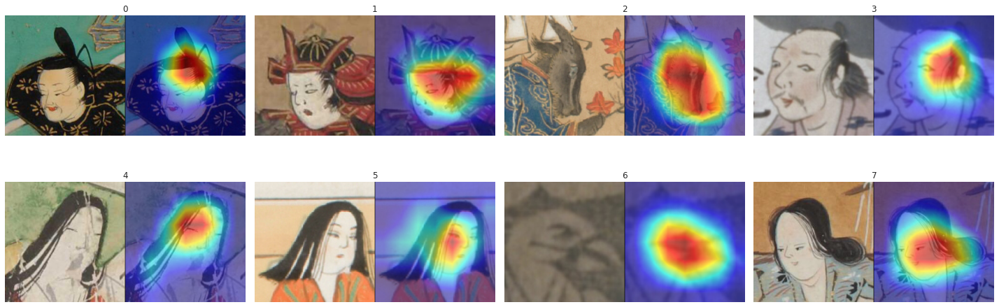

In [268]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

別の画像でもう一回！！

In [269]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00024.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_00500.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00105.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00089.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00100.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00423.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00870.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

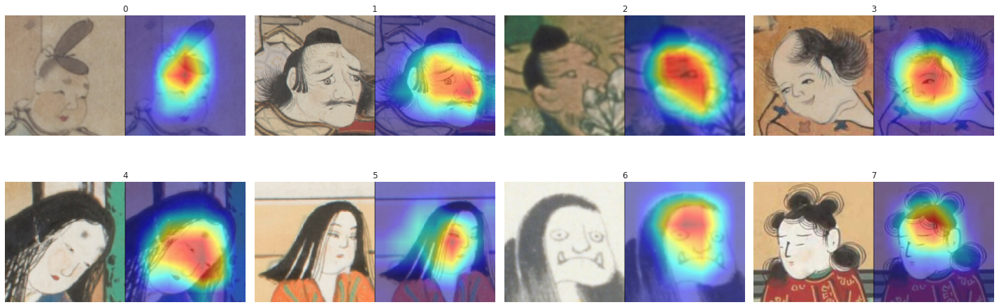

In [270]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

### resnet18d_10-0.pth  
上記の学習済み重みをロードして可視化

In [271]:
#gradcam実装
#ViTモデルを呼び出し、学習済みの重みをモデルにロードする
#学習済み重みを保存しているpthファイルを指定
cptfile = '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/timm_rsnet18d/results/timm_resnet18d_2/resnet18d_10-0.pth'
model = timm.create_model('resnet18d', pretrained=True, num_classes=8)
cpt = torch.load(cptfile)
stdict_m = cpt['model_state_dict']
model.load_state_dict(stdict_m) #モデルに学習ずみ重みを読み込み

<All keys matched successfully>

In [272]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00002.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_01382.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00068.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00166.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00025.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00295.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00027.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

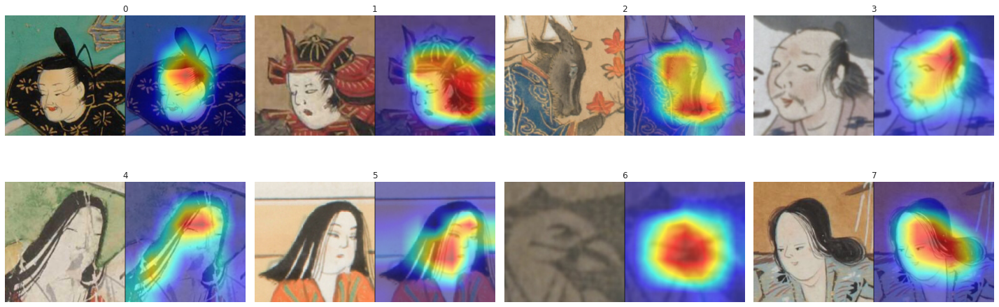

In [273]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()

別の画像でもう一回！！

In [274]:
#各カテゴリの画像を読み込む
image_url_list = ['/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/0/n_00024.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/1/n_00500.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/2/n_00105.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/3/n_00089.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/4/n_00100.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/5/n_01919.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/6/n_00423.jpg',
                  '/content/drive/MyDrive/compe/Nishika/JapanPic_classifier/train/new_train/7/n_00870.jpg'
                  ]
images_list = []

#画像データを前処理する
model.eval()

for i in range(len(image_url_list)):
    image_url = image_url_list[i]
    img = np.array(Image.open(image_url))
    img = cv2.resize(img, (224, 224))
    img = np.float32(img) / 255
    input_tensor = preprocess_image(img, mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])

    #gradcamの設定
    targets = [ClassifierOutputTarget(i)] #引数にラベルを指定
    target_layers = [model.layer4[-1]] #modelのlayerを指定。
    cam = GradCAM(model=model, target_layers=target_layers) #GradCAMクラスの呼び出し
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    cam_image = show_cam_on_image(img, grayscale_cam[0, :], use_rgb=True) #元画像とヒートマップ画像を重ね合わせた画像を生成
    grayscale_cam = grayscale_cam[0, :]
    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    #元画像とヒートマップを合わせた画像を描画
    cam = np.uint8(255*grayscale_cam[0, :])
    cam = cv2.merge([cam, cam, cam])
    images = np.hstack((np.uint8(255*img), cam , cam_image))
    images_list.append(images)
    # Image.fromarray(images)

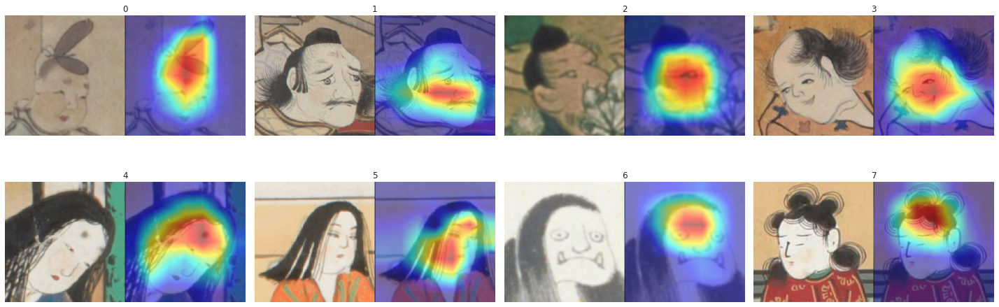

In [275]:
plt.figure(figsize = (20, 20))
for i, image in enumerate(images_list):
    plt.subplot(6,4,i+1)
    plt.axis('off')
    plt.imshow(image)
    plt.title(i)
plt.tight_layout()
plt.show()